# connection and libraries

In [3]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [4]:
import os
import math
import random
from datetime import datetime, timedelta
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import seaborn as sns
from scipy.stats import linregress
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader, TensorDataset
from sklearn.metrics import mean_squared_error, r2_score
import copy, math, random, tqdm
from sklearn.preprocessing import LabelEncoder
from scipy.interpolate import UnivariateSpline



# dataset

In [5]:
# @title
def merge_site_df_ETtoNEON(df_n, df_E_T, NEON_variables_name):

    df_E_T = df_E_T.copy()
    site_unique = df_E_T['Site Id'].unique()[0]
    print("Processing site:", site_unique)

    # Convert datetime
    df_E_T['TIMESTAMP_END_df_ET'] = pd.to_datetime(df_E_T['TIMESTAMP_END'], format='%Y%m%d%H%M')
    df_n['TIMESTAMP_END_df_n'] = pd.to_datetime(df_n['TIMESTAMP_END'], format='%Y%m%d%H%M')

    # Split NEON vs Other variables
    NEON_variables = df_E_T[NEON_variables_name + ['TIMESTAMP_END_df_ET']]

    # Merge on datetime
    df_merged = pd.merge(df_n, NEON_variables, left_on='TIMESTAMP_END_df_n', right_on='TIMESTAMP_END_df_ET', how='inner')

    # Plot hexbin with correlation
    plt.hexbin(df_merged['SW_IN_F'], df_merged['SolarRadIn_NEON'],
               gridsize=200, cmap='inferno', bins='log')
    Stat_df = df_merged[['SW_IN_F', 'SolarRadIn_NEON']].dropna()
    plt.xlabel('SW_IN_F new')
    plt.ylabel('SolarRadIn_NEON new')
    plt.title('new')
    corr_val = np.corrcoef(Stat_df['SW_IN_F'], Stat_df['SolarRadIn_NEON'])[0, 1]
    plt.text(0.05, 0.95, f'R = {corr_val:.2f}', transform=plt.gca().transAxes)
    plt.tight_layout()
    plt.show()

    plt.plot(df_merged['TIMESTAMP_END_df_n'], df_merged['SW_IN_F'], label='SW_IN_F')
    plt.plot(df_merged['TIMESTAMP_END_df_n'], df_merged['SolarRadIn_NEON'], label='SolarRadIn_NEON')
    plt.xlim(pd.to_datetime(['2020-08-10', '2020-08-12']))
    plt.legend()
    plt.show()

    print(site_unique, df_n.shape, df_merged.shape)
    return df_merged


In [6]:
# @title
def compute_mean_nee_3lastdays_nighttime(
    df,
    nee_col="NEE_PI",
    solar_col="SolarRadIn_NEON",
    solar_threshold=2.5,
    window_nights=3,
    verbose=True
):
    """
    Compute mean nighttime NEE over the last 3 calendar nights (single-site).
    Missing points are ignored; NaN only if all 3 nights have no data.
    Output column aligns exactly with df (same length and order).
    """

    if not isinstance(df.index, pd.DatetimeIndex):
        raise TypeError("df index must be a DatetimeIndex")

    if verbose:
        print("Computing Mean_NEE_3lastdays (night-based, single-site)...")

    # Pre-allocate output (guarantees alignment)
    mean_nee = pd.Series(index=df.index, dtype="float64")

    g = df.copy()

    # Identify nighttime
    g["is_night"] = g[solar_col] < solar_threshold

    # Define night-date (group all nighttime hours into the same night)
    g["night_date"] = g.index.normalize()
    g.loc[g.index.hour < 12, "night_date"] -= pd.Timedelta(days=1)

    # Compute nightly mean NEE (NaNs automatically ignored)
    nightly_mean = (
        g.loc[g["is_night"]]
        .groupby("night_date")[nee_col]
        .mean()
    )

    # Assign mean of previous 3 nights to each timestamp
    for t in g.index:
        current_night = g.loc[t, "night_date"]

        last_nights = [
            current_night - pd.Timedelta(days=i)
            for i in range(1, window_nights + 1)
        ]

        values = nightly_mean.reindex(last_nights).dropna()

        # Mean exists if at least one of the last 3 nights exists
        mean_nee.loc[t] = values.mean() if not values.empty else np.nan


    # Attach output (no index changes)
    mean_nee = mean_nee.where(mean_nee >= 0, 0.25)
    df["Mean_NEE_3lastdays"] = mean_nee

    # # plt.hist(mean_nee)
    # # plt.show()
    # plt.figure(figsize=(2, 2))
    # plt.scatter(df[nee_col], mean_nee, s=1)
    # plt.xlabel(nee_col)
    # plt.ylabel('Mean_NEE_3lastdays')
    # plt.show()

    if verbose:
        valid = df["Mean_NEE_3lastdays"].notna().sum()
        print(f"Mean_NEE_3lastdays computed for {valid} / {len(df)} timestamps")

    return df.reset_index(drop=True)


Processing site: xAB


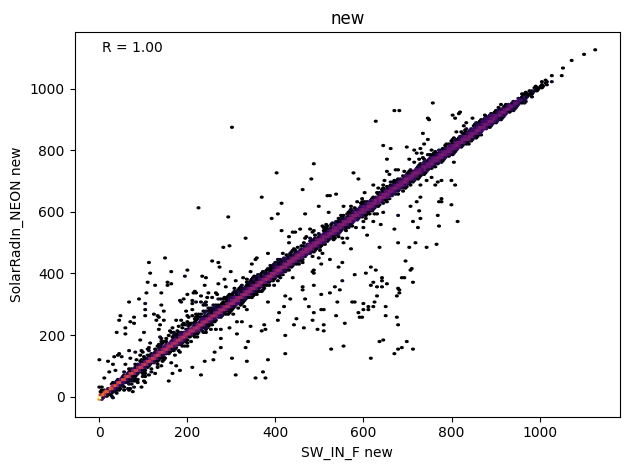

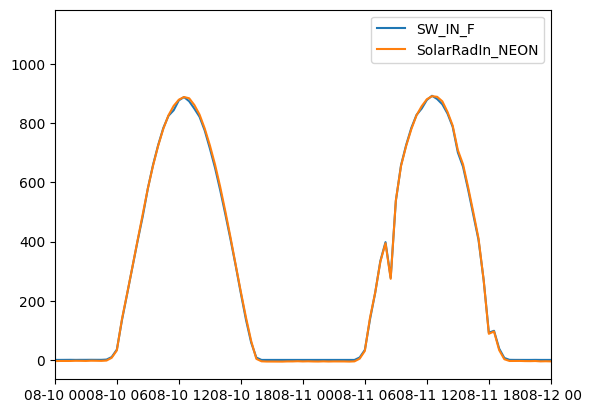

xAB (105216, 211) (87612, 252)
Computing Mean_NEE_3lastdays (night-based, single-site)...
Mean_NEE_3lastdays computed for 87612 / 87612 timestamps
Processed files: 1
Processing site: xBL


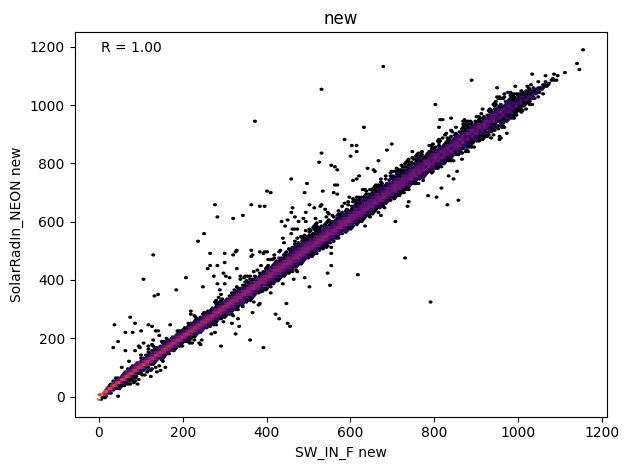

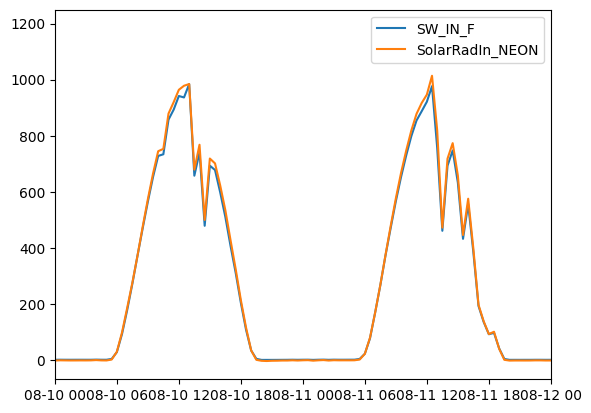

xBL (105216, 255) (87618, 296)
Computing Mean_NEE_3lastdays (night-based, single-site)...
Mean_NEE_3lastdays computed for 87618 / 87618 timestamps
Processed files: 2
Processing site: xRN


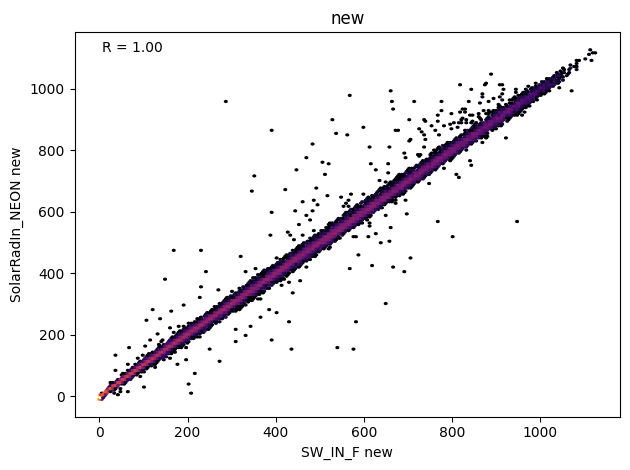

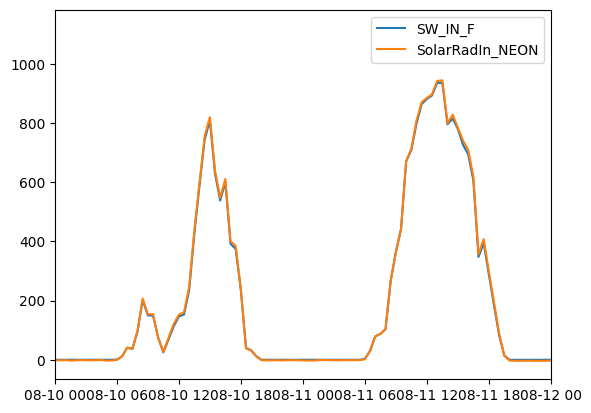

xRN (105216, 211) (87618, 252)
Computing Mean_NEE_3lastdays (night-based, single-site)...
Mean_NEE_3lastdays computed for 87618 / 87618 timestamps
Processed files: 3
Processing site: xHA


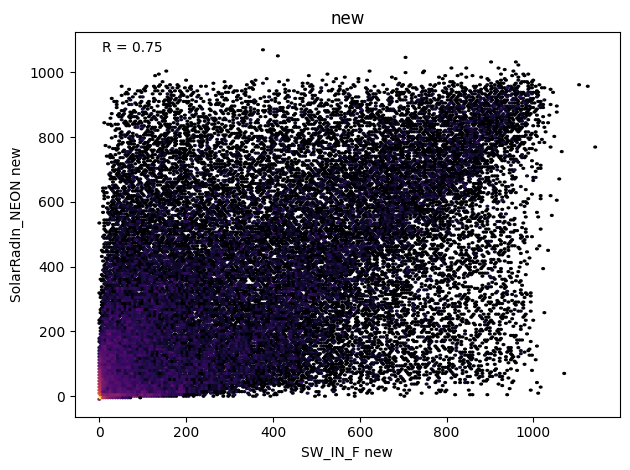

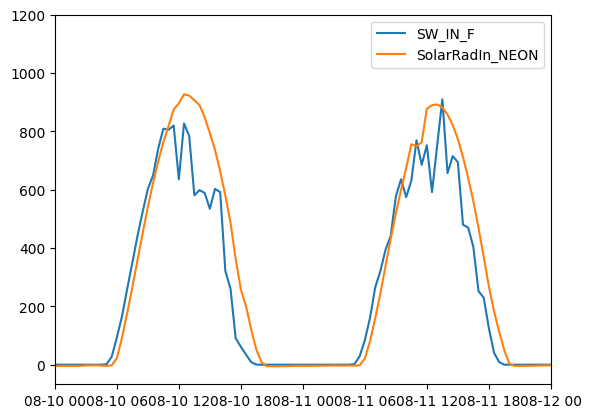

xHA (105216, 241) (87616, 282)
Computing Mean_NEE_3lastdays (night-based, single-site)...
Mean_NEE_3lastdays computed for 87616 / 87616 timestamps
Processed files: 4
Processing site: xTA


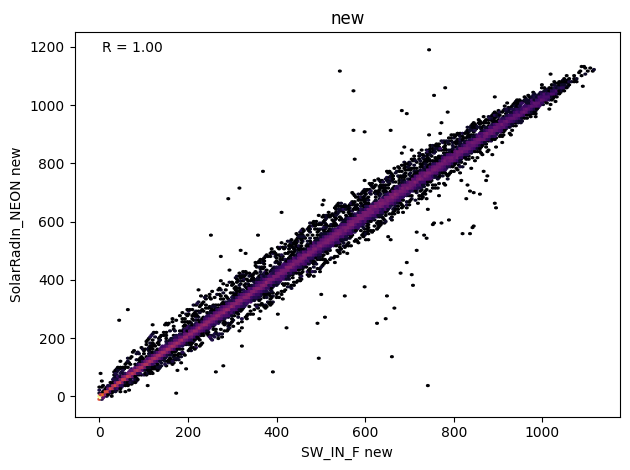

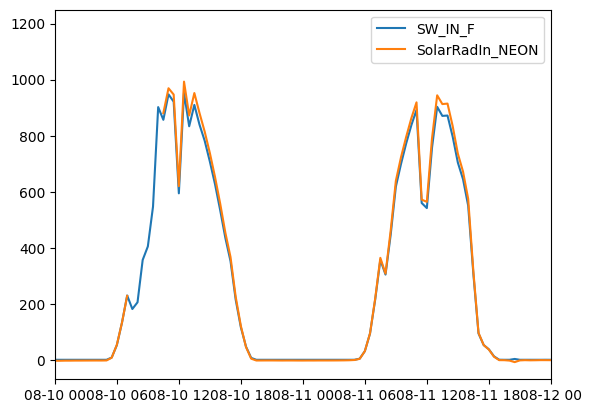

xTA (105216, 253) (79238, 294)
Computing Mean_NEE_3lastdays (night-based, single-site)...
Mean_NEE_3lastdays computed for 79238 / 79238 timestamps
Processed files: 5
Processing site: xST


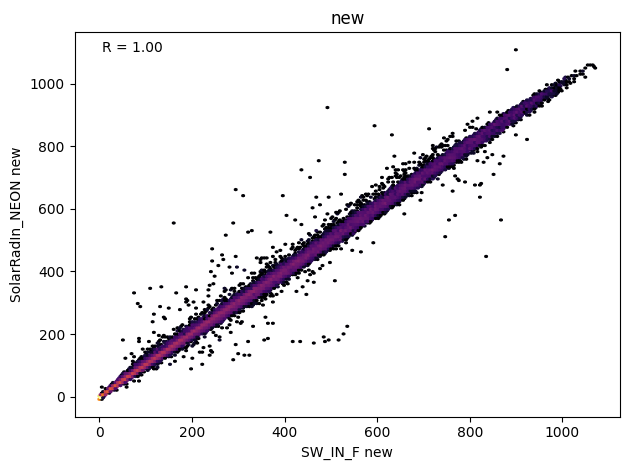

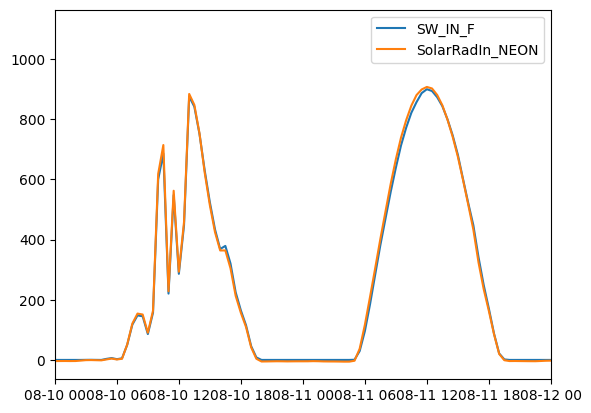

xST (105216, 255) (87616, 296)
Computing Mean_NEE_3lastdays (night-based, single-site)...
Mean_NEE_3lastdays computed for 87616 / 87616 timestamps
Processed files: 6
Processing site: xTR


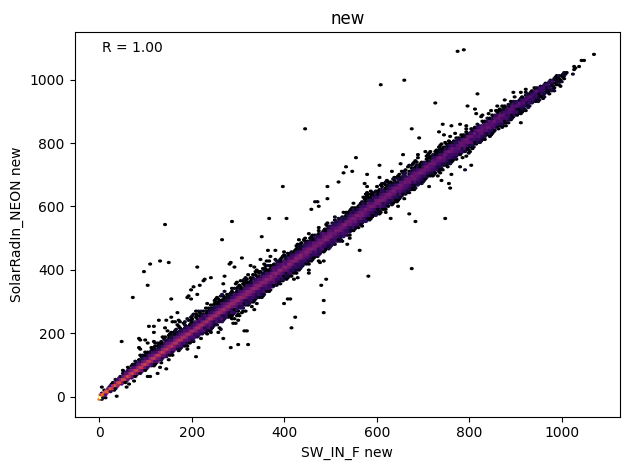

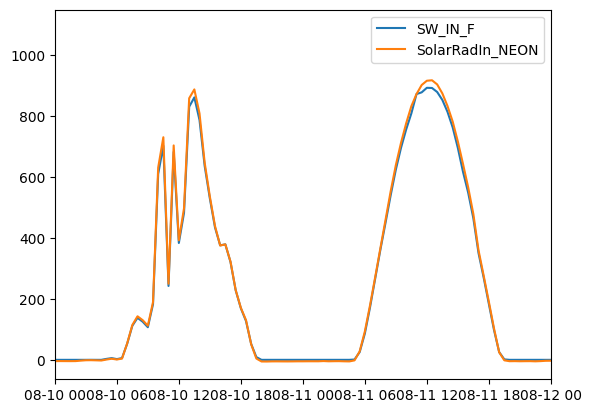

xTR (105216, 255) (87616, 296)
Computing Mean_NEE_3lastdays (night-based, single-site)...
Mean_NEE_3lastdays computed for 87616 / 87616 timestamps
Processed files: 7
Processing site: xML


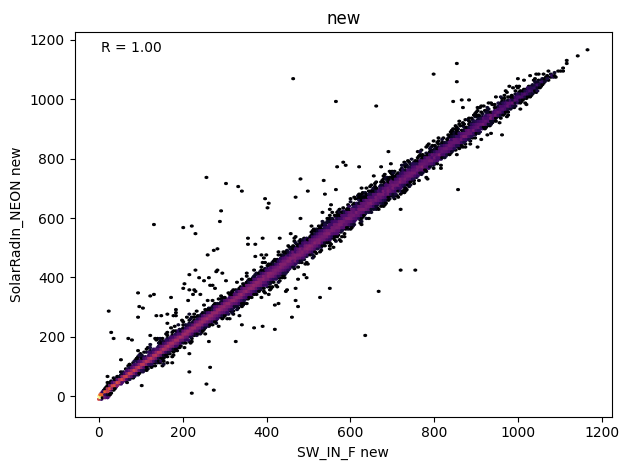

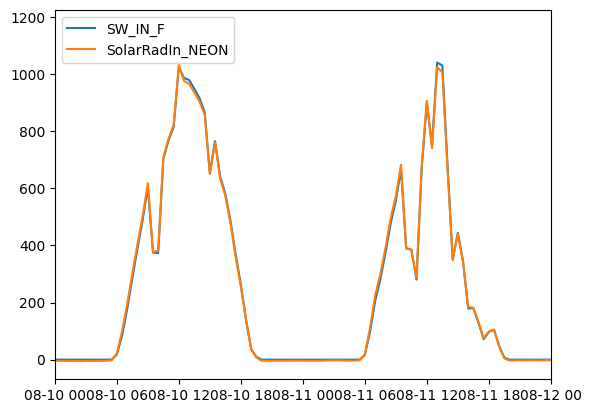

xML (105216, 255) (87618, 296)
Computing Mean_NEE_3lastdays (night-based, single-site)...
Mean_NEE_3lastdays computed for 87618 / 87618 timestamps
Processed files: 8
Skipping AMF_US-xDL_FLUXNET_FULLSET_HH_2019-2024_4-7.csv: no corresponding E_T file
Processing site: xGR


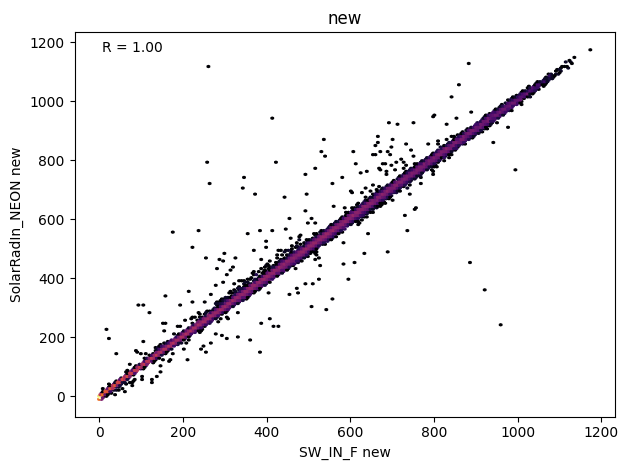

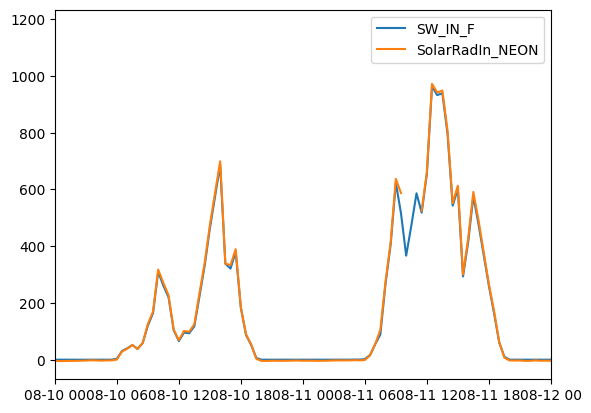

xGR (105216, 237) (87618, 278)
Computing Mean_NEE_3lastdays (night-based, single-site)...
Mean_NEE_3lastdays computed for 87618 / 87618 timestamps
Processed files: 9
Processing site: xWD


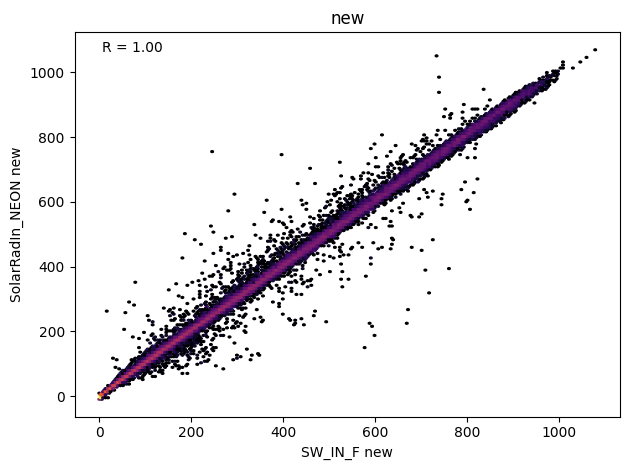

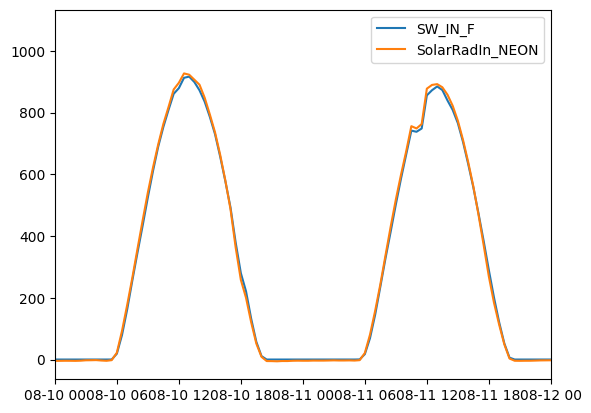

xWD (105216, 255) (87616, 296)
Computing Mean_NEE_3lastdays (night-based, single-site)...
Mean_NEE_3lastdays computed for 87616 / 87616 timestamps
Processed files: 10
Processing site: xSE


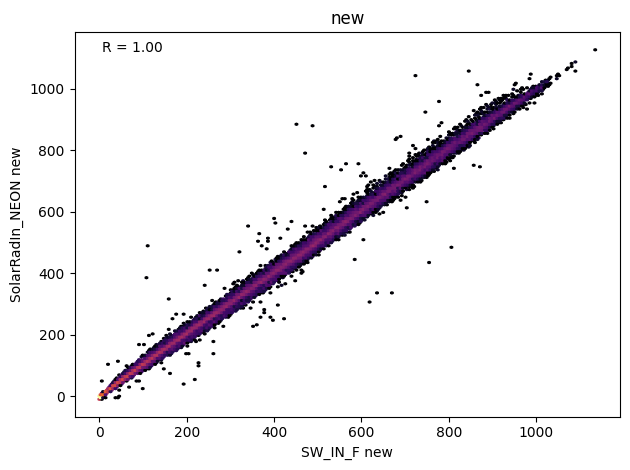

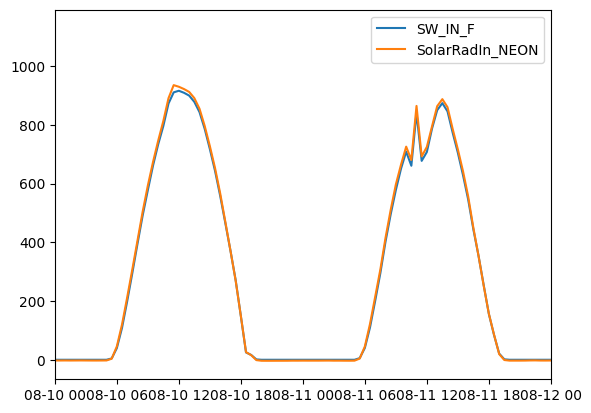

xSE (105216, 255) (87618, 296)
Computing Mean_NEE_3lastdays (night-based, single-site)...
Mean_NEE_3lastdays computed for 87618 / 87618 timestamps
Processed files: 11
Skipping AMF_US-xYE_FLUXNET_FULLSET_HH_2019-2024_4-7.csv: no corresponding E_T file
Processing site: xUN


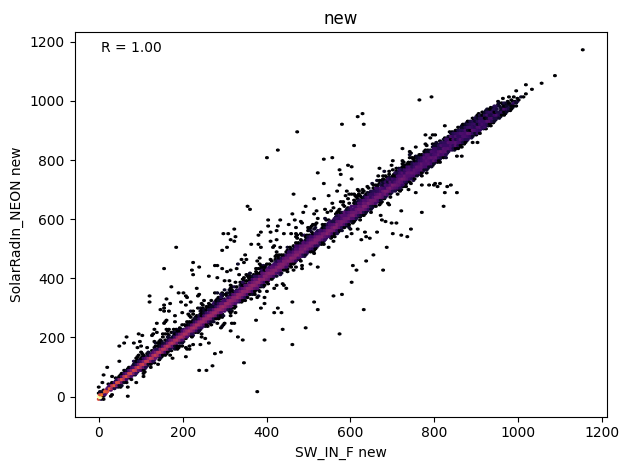

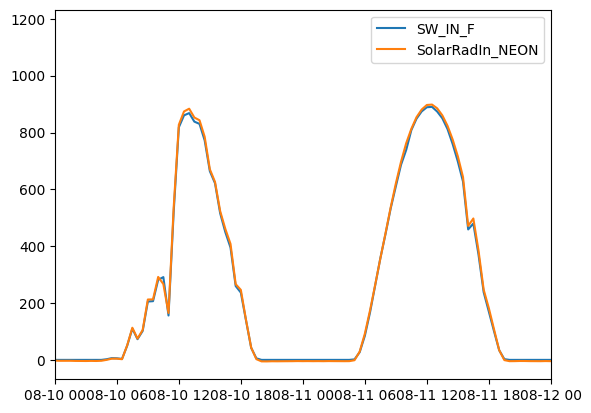

xUN (105216, 255) (87616, 296)
Computing Mean_NEE_3lastdays (night-based, single-site)...
Mean_NEE_3lastdays computed for 87616 / 87616 timestamps
Processed files: 12
Processing site: xUK


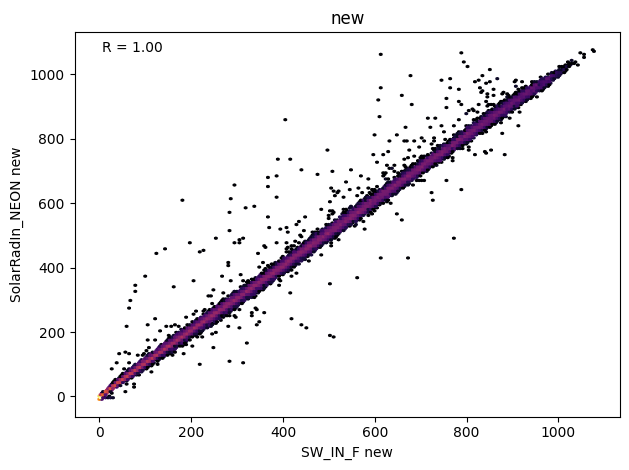

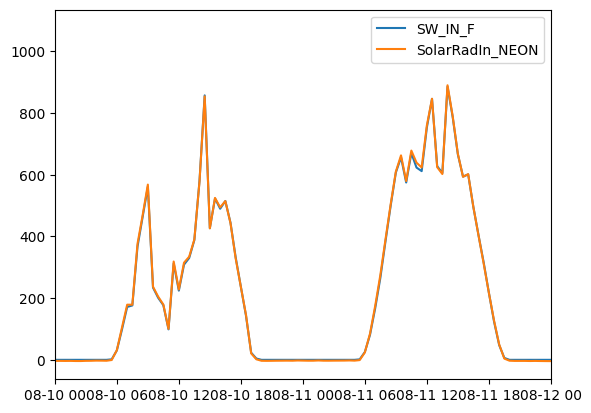

xUK (105216, 253) (87616, 294)
Computing Mean_NEE_3lastdays (night-based, single-site)...
Mean_NEE_3lastdays computed for 87616 / 87616 timestamps
Processed files: 13
Processing site: xNQ


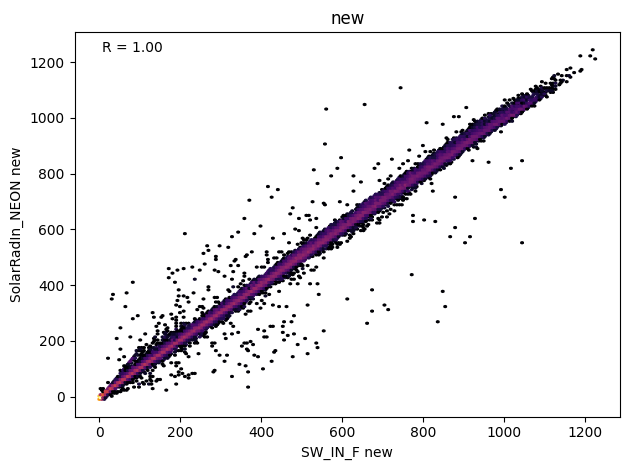

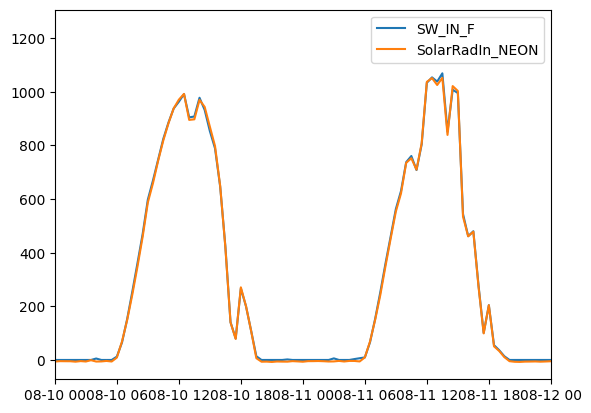

xNQ (105216, 255) (87614, 296)
Computing Mean_NEE_3lastdays (night-based, single-site)...
Mean_NEE_3lastdays computed for 87614 / 87614 timestamps
Processed files: 14
Processing site: xCP


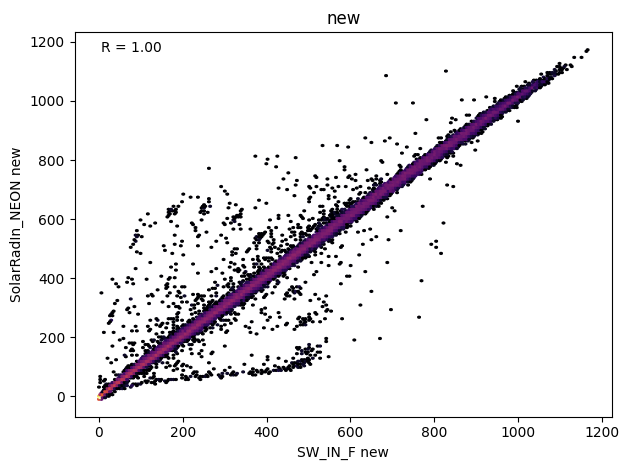

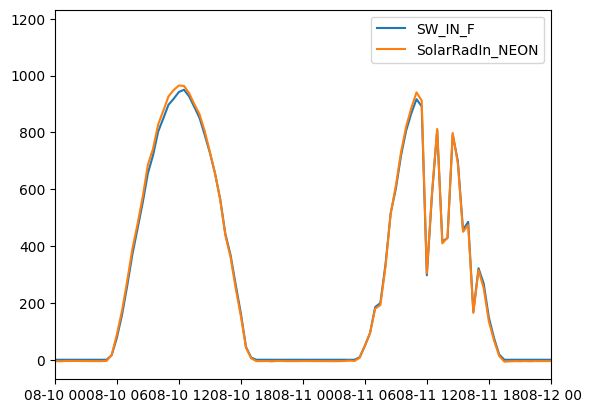

xCP (105216, 255) (87614, 296)
Computing Mean_NEE_3lastdays (night-based, single-site)...
Mean_NEE_3lastdays computed for 87614 / 87614 timestamps
Processed files: 15
Processing site: xKA


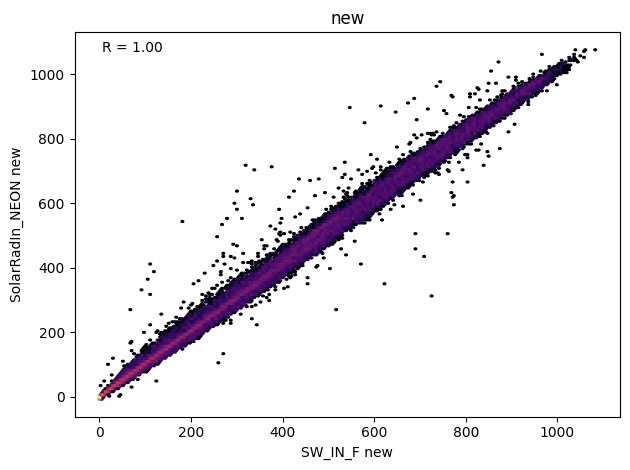

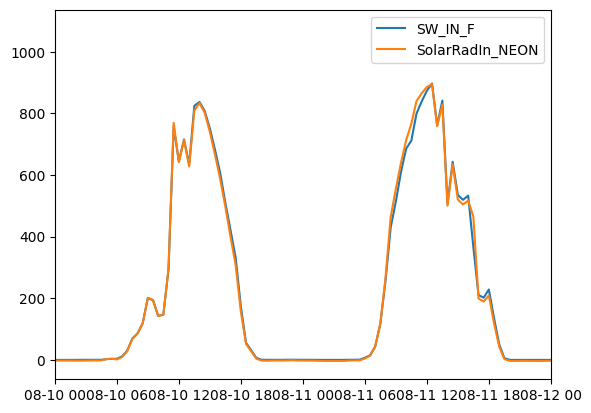

xKA (105216, 253) (87616, 294)
Computing Mean_NEE_3lastdays (night-based, single-site)...
Mean_NEE_3lastdays computed for 87616 / 87616 timestamps
Processed files: 16
Skipping AMF_US-xSC_FLUXNET_FULLSET_HH_2019-2024_4-7.csv: no corresponding E_T file
Processing site: xSJ


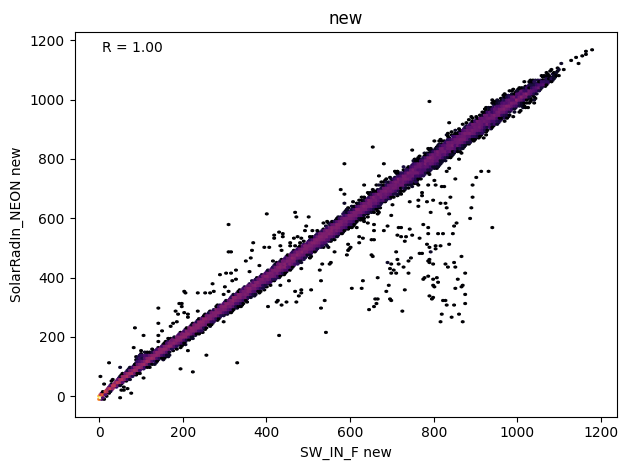

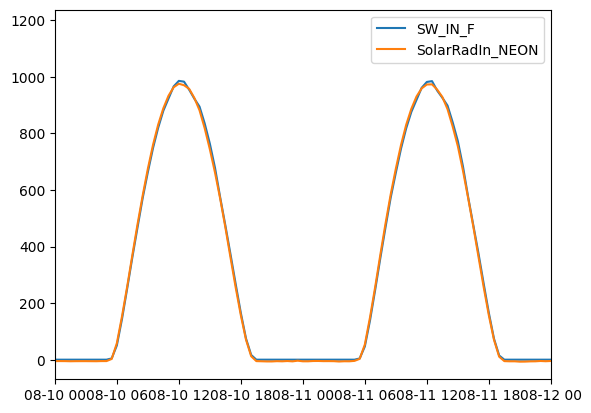

xSJ (105216, 255) (87612, 296)
Computing Mean_NEE_3lastdays (night-based, single-site)...
Mean_NEE_3lastdays computed for 87612 / 87612 timestamps
Processed files: 17
Skipping AMF_US-xMB_FLUXNET_FULLSET_HH_2019-2024_4-7.csv: no corresponding E_T file
Skipping AMF_US-xJR_FLUXNET_FULLSET_HH_2019-2024_5-7.csv: no corresponding E_T file
Processing site: xSL


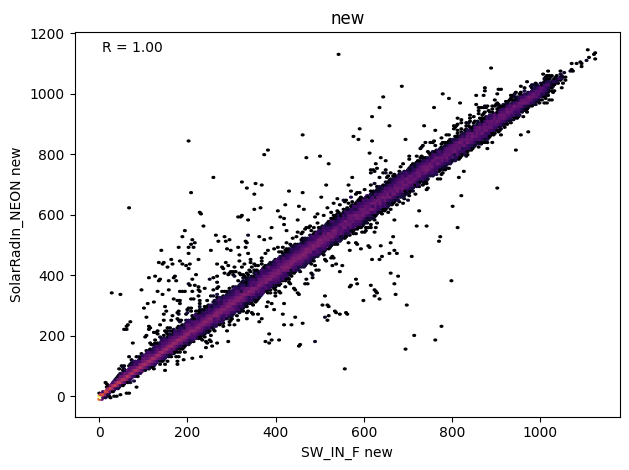

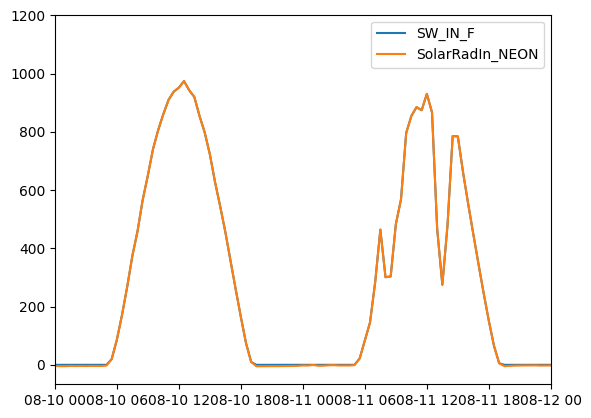

xSL (105216, 255) (87614, 296)
Computing Mean_NEE_3lastdays (night-based, single-site)...
Mean_NEE_3lastdays computed for 87614 / 87614 timestamps
Processed files: 18
Processing site: xSR


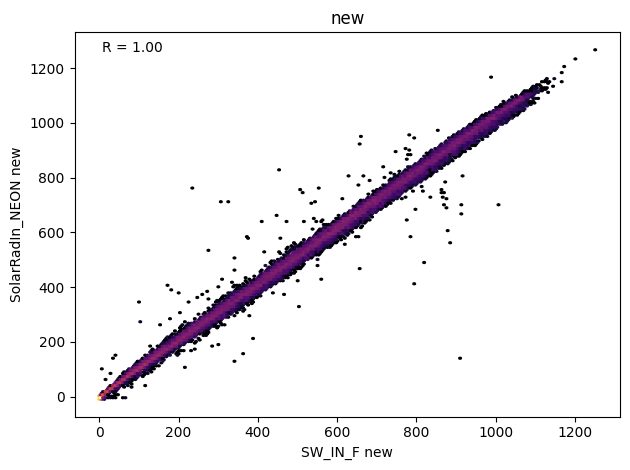

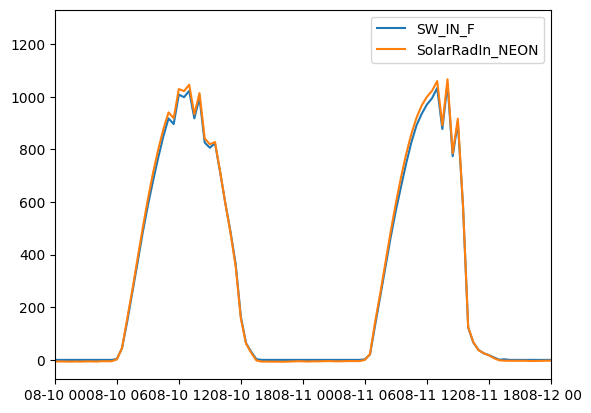

xSR (105216, 255) (87634, 296)
Computing Mean_NEE_3lastdays (night-based, single-site)...
Mean_NEE_3lastdays computed for 87634 / 87634 timestamps
Processed files: 19
Processing site: xKZ


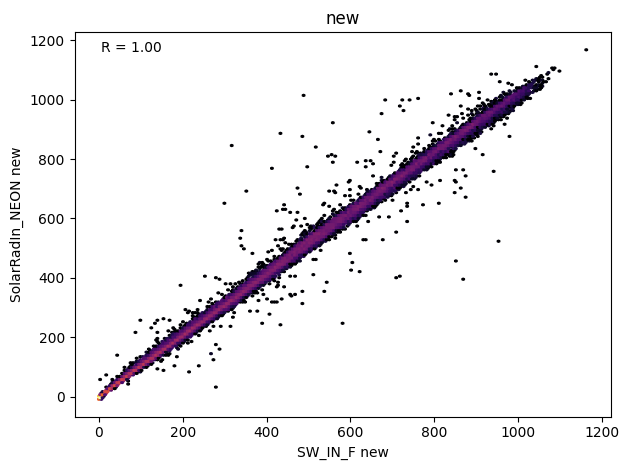

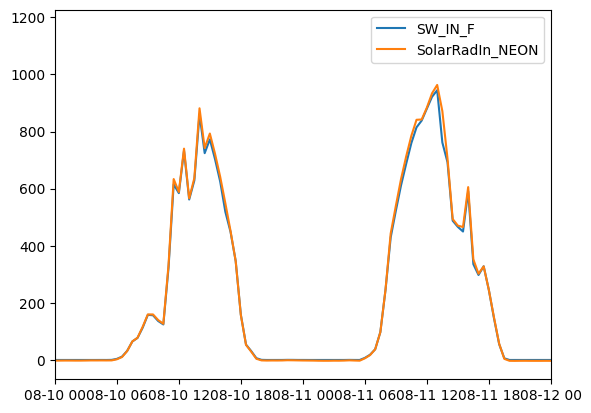

xKZ (105216, 255) (87616, 296)
Computing Mean_NEE_3lastdays (night-based, single-site)...
Mean_NEE_3lastdays computed for 87616 / 87616 timestamps
Processed files: 20
Processing site: xDJ


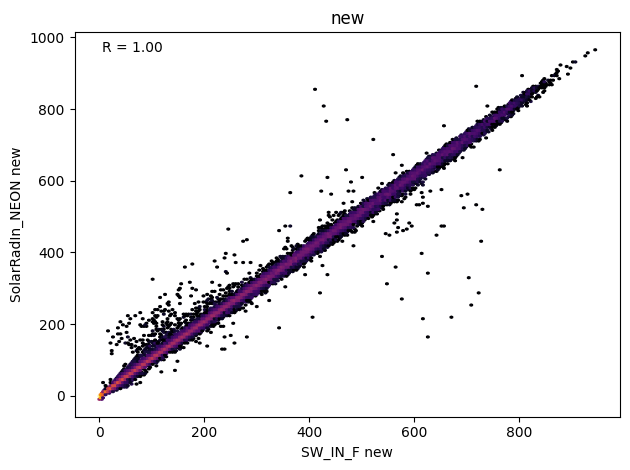

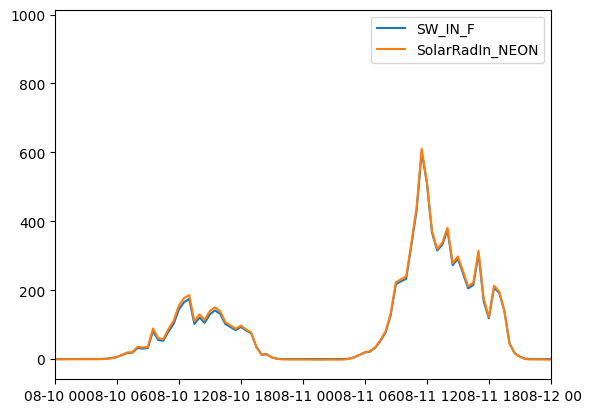

xDJ (105216, 247) (87610, 288)
Computing Mean_NEE_3lastdays (night-based, single-site)...
Mean_NEE_3lastdays computed for 87610 / 87610 timestamps
Processed files: 21
Skipping AMF_US-xBA_FLUXNET_FLUXMET_HH_2019-2024_v1.3_r1.csv: no corresponding E_T file
Processing site: xJE


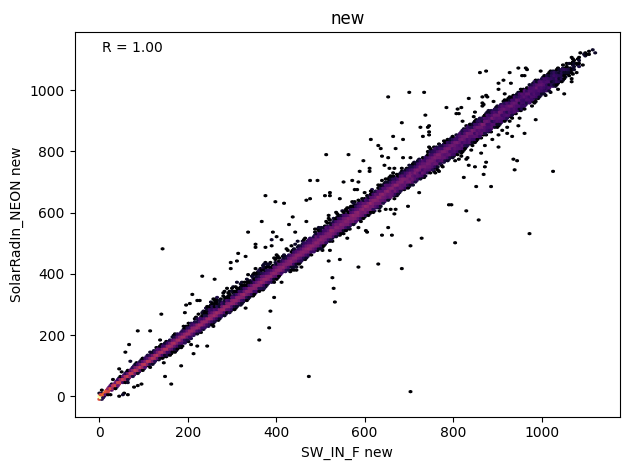

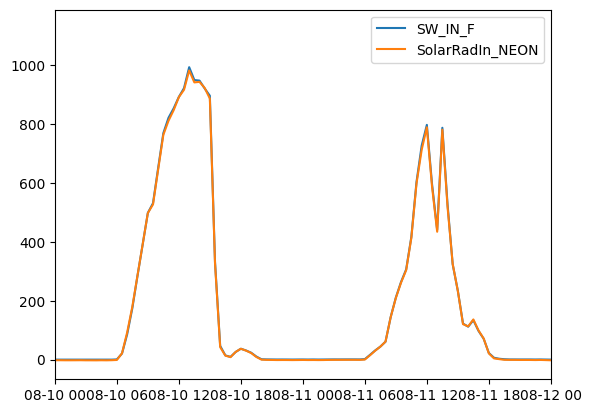

xJE (105216, 255) (87618, 296)
Computing Mean_NEE_3lastdays (night-based, single-site)...
Mean_NEE_3lastdays computed for 87618 / 87618 timestamps
Processed files: 22
Processing site: xBN


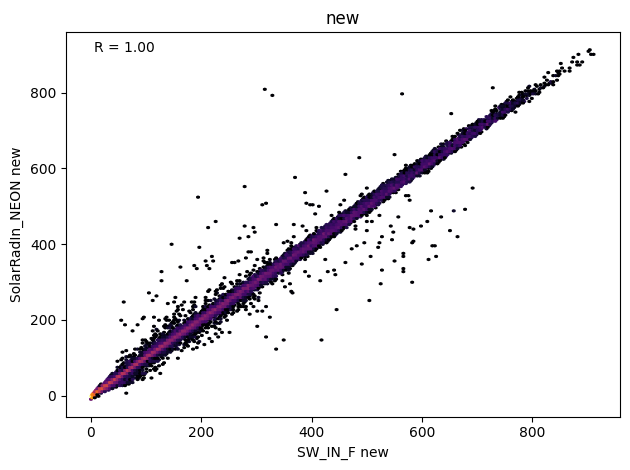

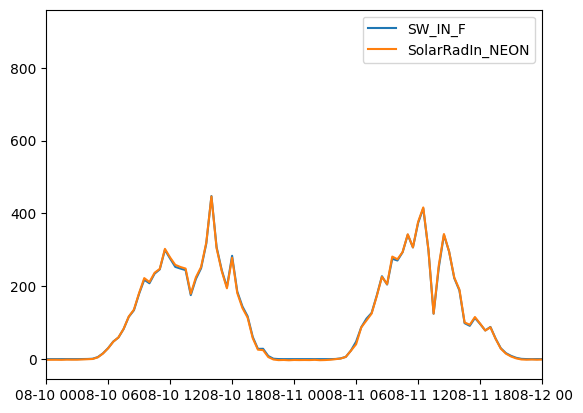

xBN (105216, 255) (51240, 296)
Computing Mean_NEE_3lastdays (night-based, single-site)...
Mean_NEE_3lastdays computed for 51240 / 51240 timestamps
Processed files: 23
Processing site: xHE


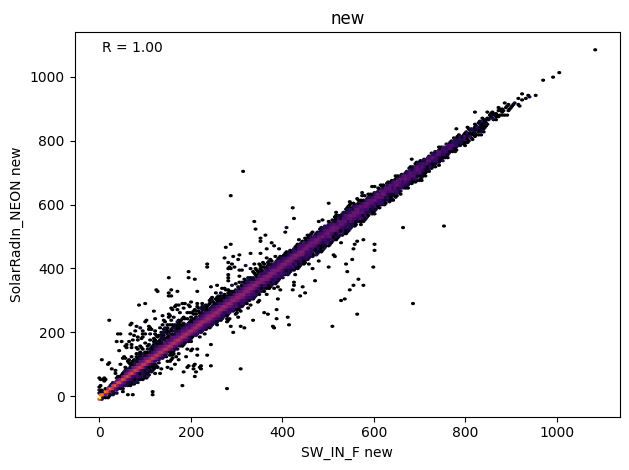

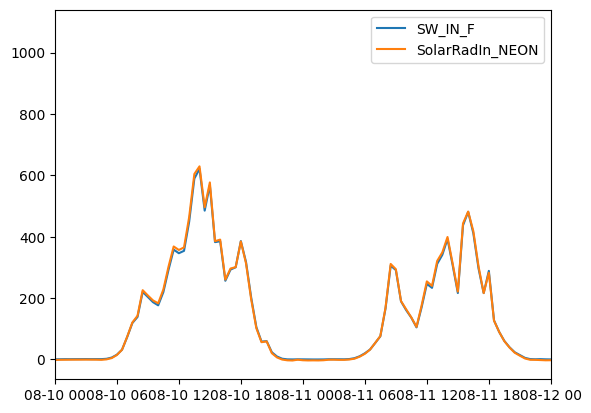

xHE (105216, 255) (87524, 296)
Computing Mean_NEE_3lastdays (night-based, single-site)...
Mean_NEE_3lastdays computed for 87524 / 87524 timestamps
Processed files: 24
Skipping AMF_US-xPU_FLUXNET_FLUXMET_HH_2019-2024_v1.3_r1.csv: no corresponding E_T file
Skipping AMF_US-xBR_FLUXNET_FLUXMET_HH_2019-2024_v1.3_r1.csv: no corresponding E_T file
Skipping AMF_US-xDS_FLUXNET_FLUXMET_HH_2019-2024_v1.3_r1.csv: no corresponding E_T file
Processing site: xDC


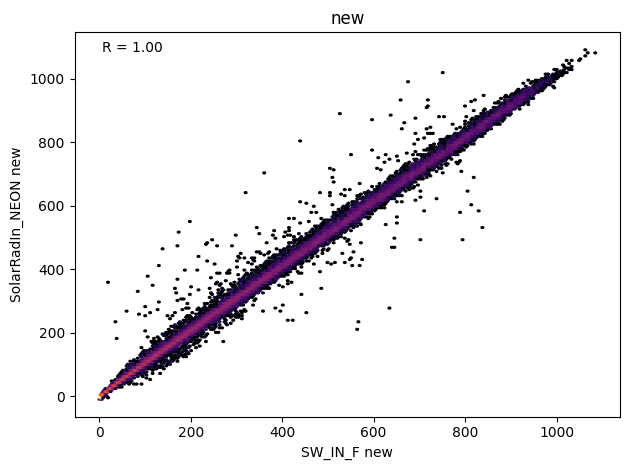

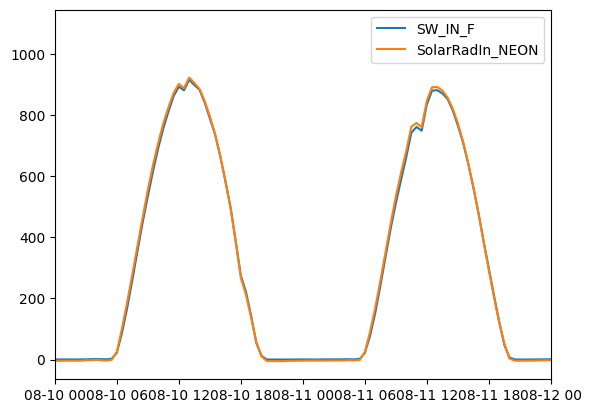

xDC (105216, 255) (87616, 296)
Computing Mean_NEE_3lastdays (night-based, single-site)...
Mean_NEE_3lastdays computed for 87616 / 87616 timestamps
Processed files: 25
Processing site: xSB


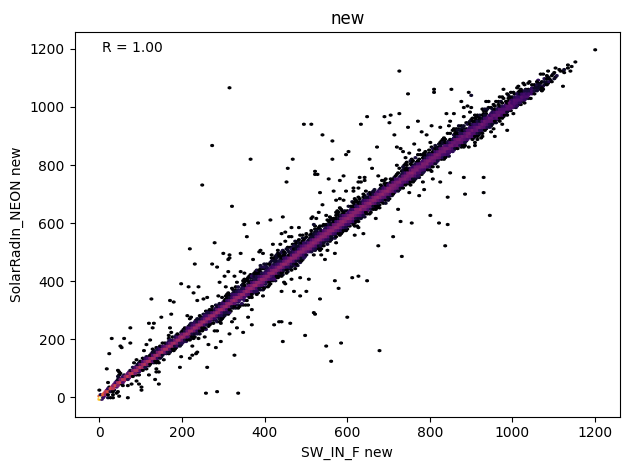

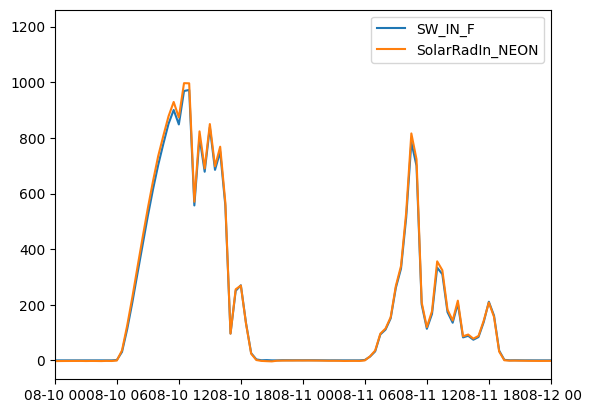

xSB (105216, 255) (87618, 296)
Computing Mean_NEE_3lastdays (night-based, single-site)...
Mean_NEE_3lastdays computed for 87618 / 87618 timestamps
Processed files: 26
Processing site: xCL


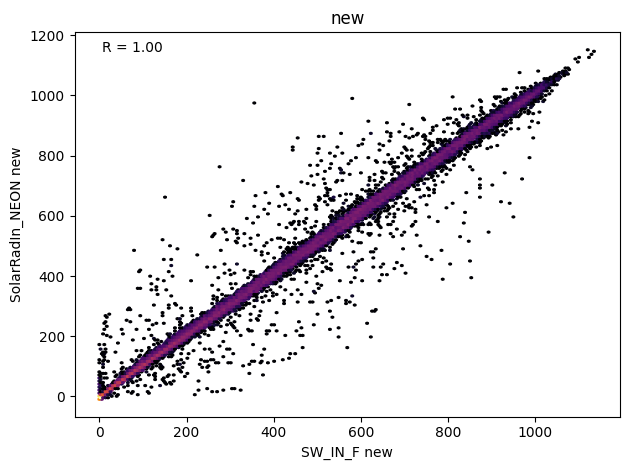

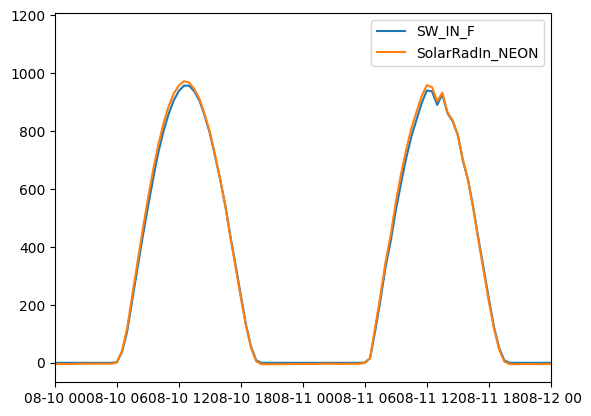

xCL (105216, 255) (87616, 296)
Computing Mean_NEE_3lastdays (night-based, single-site)...
Mean_NEE_3lastdays computed for 87616 / 87616 timestamps
Processed files: 27
Processing site: xAE


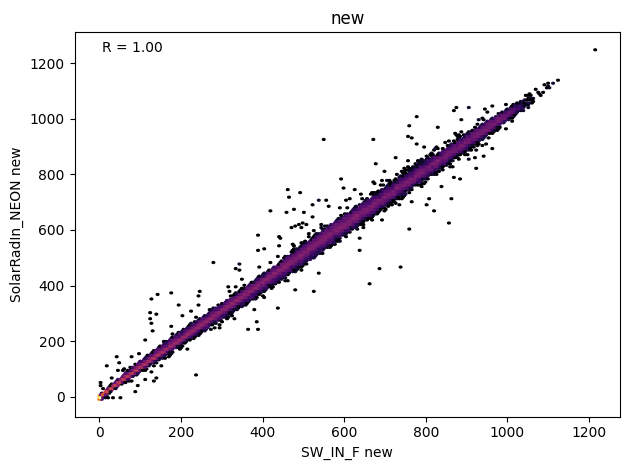

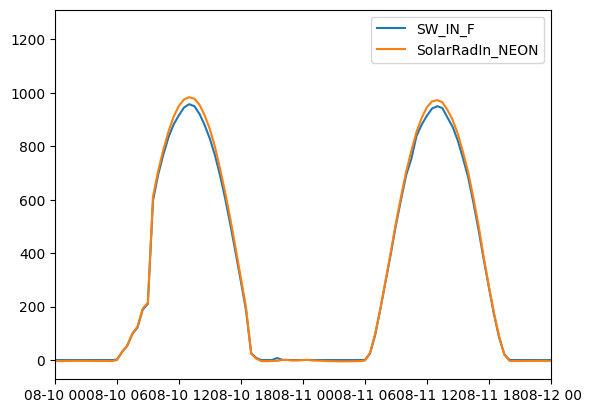

xAE (105216, 239) (87616, 280)
Computing Mean_NEE_3lastdays (night-based, single-site)...
Mean_NEE_3lastdays computed for 87616 / 87616 timestamps
Processed files: 28
Processing site: xNG


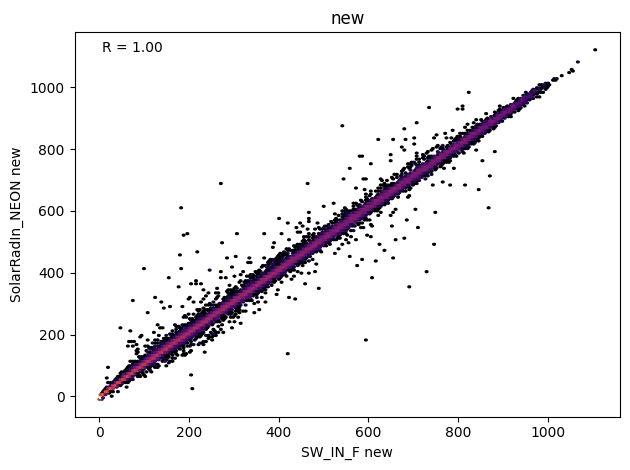

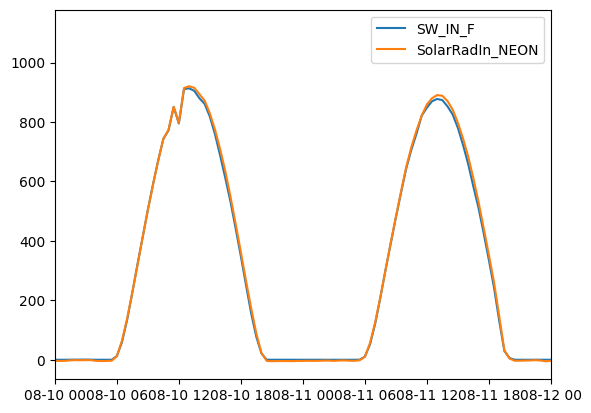

xNG (105216, 255) (87616, 296)
Computing Mean_NEE_3lastdays (night-based, single-site)...
Mean_NEE_3lastdays computed for 87616 / 87616 timestamps
Processed files: 29
Processing site: xWR


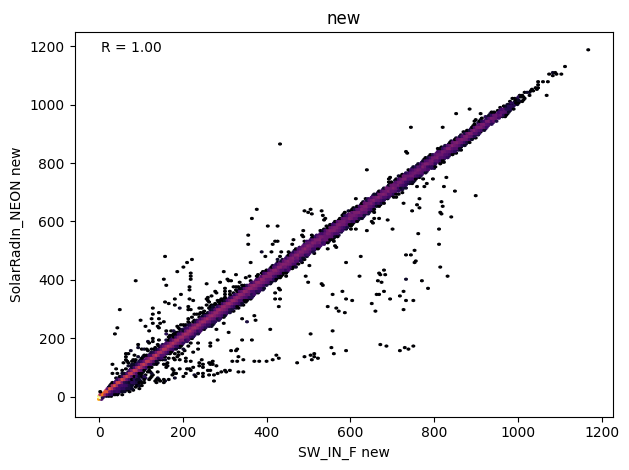

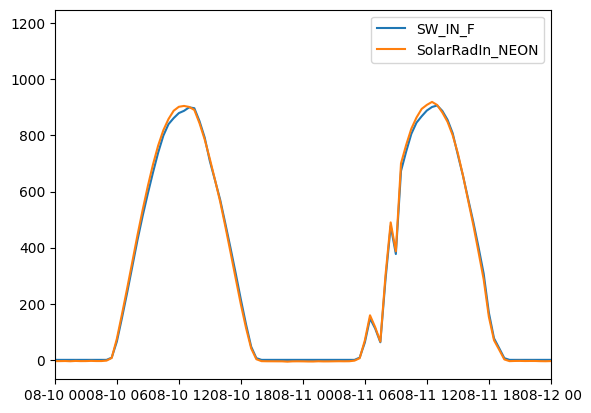

xWR (105216, 255) (87612, 296)
Computing Mean_NEE_3lastdays (night-based, single-site)...
Mean_NEE_3lastdays computed for 87612 / 87612 timestamps
Processed files: 30
Processing site: xTL


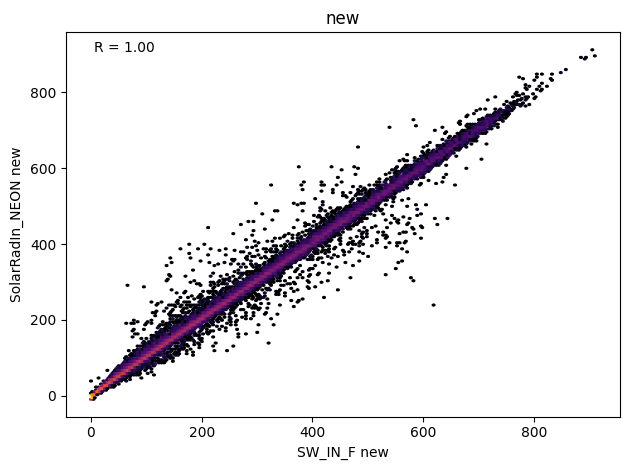

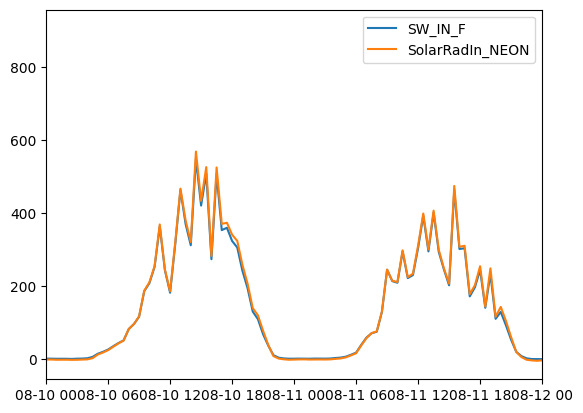

xTL (105216, 247) (87610, 288)
Computing Mean_NEE_3lastdays (night-based, single-site)...
Mean_NEE_3lastdays computed for 87610 / 87610 timestamps
Processed files: 31
Skipping AMF_US-xNW_FLUXNET_FLUXMET_HH_2019-2024_v1.3_r1.csv: no corresponding E_T file
Processing site: xRM


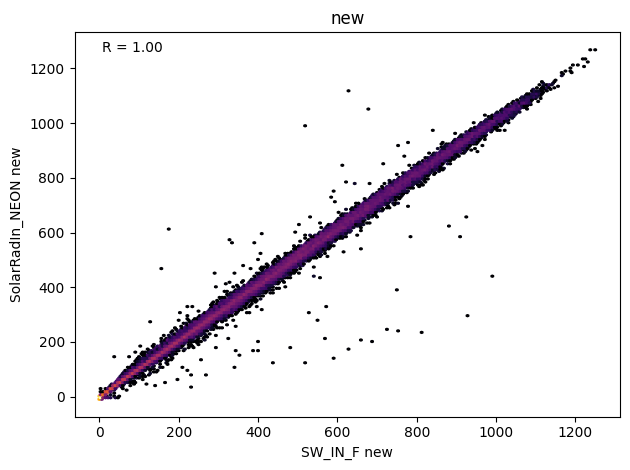

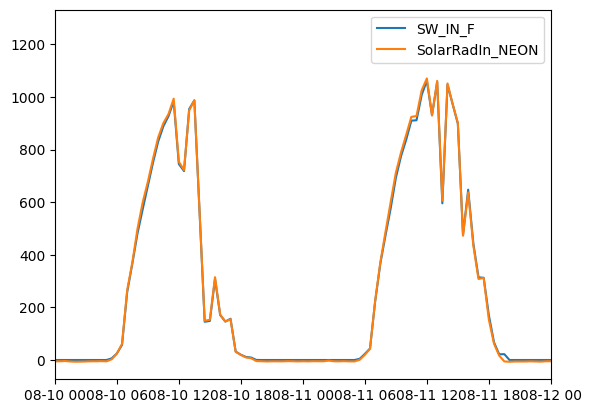

xRM (105216, 255) (87614, 296)
Computing Mean_NEE_3lastdays (night-based, single-site)...
Mean_NEE_3lastdays computed for 87614 / 87614 timestamps
Processed files: 32


In [7]:
# # @title
# # define path
# # code for the time has access to raw data, uncommand
# # path_E_T = '/content/drive/MyDrive/Ameriflux_GOES/19_23_neon_amf/'  # for partitioned E and T
# # path_neon = '/content/drive/MyDrive/Postdoc/NEON_Sites_data/'

# NEON_variables_name = ["Site Id","SoilMoisture_NEON","AirTemperature_NEON","SolarRadIn_NEON","RH_NEON","Rain_NEON","PAR_NEON","fluxTemp_NEON","ustar_NEON","WindSpeed_NEON","vpd_NEON","zeta_NEON","Tfvs_NEON","Pfvs_NEON","Efvs_NEON","Rfvs_NEON","ETfvs_NEON","Fcfvs_NEON","qfFinalCO2fvs_NEON","qfFinalH2Ofvs_NEON","Tfvs_xgb_NEON","Efvs_xgb_NEON","Tfvs_NEON","Pfvs_NEON","Efvs_NEON","Rfvs_NEON","ETfvs_NEON","Fcfvs_NEON","qfFinalCO2fvs_NEON","qfFinalH2Ofvs_NEON","Tfvs_xgb_NEON","Efvs_xgb_NEON","opt_NEON",
#                        'LE', 'H', 'LW_IN', 'T_soil1to4', 'G_1to5', 'NEE_PI', 'CO2_MIXING_RATIO_1_1_1']

# # === Initialize Storage ===
# allData = []
# loop_number = 0

# # === Process Each File ===
# for file_name in os.listdir(path_neon):  # [0:5]:
#     neon_file_path = os.path.join(path_neon, file_name)
#     df_n = pd.read_csv(neon_file_path).replace(-9999.0, np.nan)
#     site_id = file_name[7:10]

#     # Construct corresponding E_T path
#     et_file_path = os.path.join(path_E_T, site_id + '.csv')
#     if not os.path.exists(et_file_path):
#         print(f"Skipping {file_name}: no corresponding E_T file")
#         continue  # skip to next file

#     df_E_T = pd.read_csv(et_file_path).replace(-9999.0, np.nan)
#     df_E_T['Site Id'] = site_id

#     # Merge NEON and E_T
#     df_out = merge_site_df_ETtoNEON(df_n, df_E_T, NEON_variables_name)

#     df_out_nee_mean = df_out.copy()
#     df_out_nee_mean.set_index(pd.to_datetime(df_out_nee_mean['TIMESTAMP_END'], format='%Y%m%d%H%M'), inplace=True)

#     mean_nee_df = compute_mean_nee_3lastdays_nighttime(df_out_nee_mean,
#     nee_col="NEE_PI", solar_col="SolarRadIn_NEON", solar_threshold=2.5, window_nights=7)

#     df_out['Mean_NEE_3lastdays'] = mean_nee_df['Mean_NEE_3lastdays']

#     allData.append(df_out)
#     loop_number += 1
#     print(f"Processed files: {loop_number}")

# # Concatenate all processed data
# # allData_df = pd.concat(allData, ignore_index=True)
# allData_n = [df.loc[:, ~df.columns.duplicated()] for df in allData]
# allData_df = pd.concat(allData_n, ignore_index=True) # allData_df = pd.concat(allData, ignore_index=True)


In [9]:
# # @title
# # # --- Load your dataset ---
# data = allData_df.copy() # allData[2].copy() #
# data['SW_IN'] = data['SW_IN_F']
# data.index = pd.to_datetime(data['TIMESTAMP_END'], format='%Y%m%d%H%M')
# data['hour'] = data.index.hour
# data['doy'] = data.index.dayofyear
# data['Pfvs_NEON'] = -data['Pfvs_NEON']
# print(data.shape)

# # # Keep all prior filters:
# data = data[data['NEE_VUT_REF_QC'] < 1.5]
# data = data[~((data['NIGHT'] == 1) & (data['NEE_VUT_REF'] < -1))]
# data = data[data['ustar_NEON'] < 1]
# data.loc[data["GPP_NT_VUT_REF"] < -1, "GPP_NT_VUT_REF"] = np.nan
# data.loc[data["GPP_DT_VUT_REF"] < -1, "GPP_DT_VUT_REF"] = np.nan
# # data = data[data['GPP_np_FI'] <= data['GPP_np_FI'].dropna().quantile(0.99999)]
# print(data.shape)

(2758866, 290)
(1918027, 290)


In [10]:
# # @title
# # --- Main Loop Over Sites (Train + Predict + Plot) ---
# path = '/content/drive/MyDrive/Ameriflux_GOES/19_23_neon_amf/'
# site_files = [f for f in os.listdir(path) if f.endswith('.csv')]
# amflxForManuscript = pd.read_csv('/content/drive/MyDrive/Ameriflux_GOES/Tower_Info/AMERIFLUX_Active_info - ForManuscript (1).csv')
# df_sites_Spec = amflxForManuscript.copy()

# Site_location = []
# i_number = 0

# for f in site_files:
#     site = f.replace('.csv', '')
#     # print(f"Processing site: {site}", i_number)
#     i_number += 1
#     Site_toLocate = 'US-'+ site
#     siteSpec = df_sites_Spec[df_sites_Spec['Site Id'] == Site_toLocate]

#     # site location df
#     if siteSpec.empty:
#         print(f"Site {site} not found in df_sites_Spec.")
#         continue
#     try:
#         lat = siteSpec['Latitude'].iloc[0]
#         lon = siteSpec['Longitude'].iloc[0]
#         IGBP = siteSpec['Vegetation Abbreviation (IGBP)'].iloc[0]
#     except KeyError:
#         print(f"Latitude or longitude column not found in {site}.")
#         continue

#     Site_location.append({'site': site, 'lat': lat, 'lon': lon, 'IGBP': IGBP})

# Site_location.append({'site': 'xHE', 'lat': 63.8757, 'lon': -149.2133, 'IGBP': 'OSH'})
# Site_location.append({'site': 'xTL', 'lat':	68.6611, 'lon': -149.3705, 'IGBP': 'WET'})
# Site_location.append({'site': 'xBN', 'lat': 65.1540, 'lon': -147.5026, 'IGBP': 'ENF'})
# Site_location.append({'site': 'xDJ', 'lat': 63.8811, 'lon': -145.7514, 'IGBP': 'ENF'})

# Site_location_df = pd.DataFrame(Site_location)
# for i in data['Site Id'].unique():
#     site = i
#     data.loc[data['Site Id'] == site, 'IGBP'] = Site_location_df.loc[Site_location_df['site'] == site, 'IGBP'].values[0]


Site xHE not found in df_sites_Spec.
Site xDJ not found in df_sites_Spec.
Site xTL not found in df_sites_Spec.
Site xBN not found in df_sites_Spec.


# modeling

In [ ]:
# # Reading data here, this data has been processed previously. uncommand
# data = pd.read_csv('df_fvs_toTrain.csv')

In [11]:
import torch
print("CUDA available:", torch.cuda.is_available())
print("GPU:", torch.cuda.get_device_name(0) if torch.cuda.is_available() else "No GPU")
DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

CUDA available: True
GPU: Tesla T4


## core function + dropout MC uncertainty >>> training

In [12]:
# @title
# ==========================================================
# Revised KGML Self-Supervised with adaptive baseline and smoother coupling
# ==========================================================

import torch
import torch.nn as nn
import torch.nn.functional as F

class KGML_SelfSup(nn.Module):
    def __init__(self, nfeat):
        super().__init__()
        # Shared encoder
        self.enc = nn.Sequential(
            nn.Linear(nfeat, 128), nn.ReLU(),
            nn.Dropout(0.1),  # MC dropout
            nn.Linear(128, 128), nn.ReLU(),
            nn.Dropout(0.1)
        )

        # Stomatal conductance (monotone)
        self.gs_net = nn.Sequential(
            nn.Linear(128, 64), nn.ReLU(),
            nn.Linear(64, 1), nn.Softplus())

        # GPP head
        self.gpp_head = nn.Sequential(
            nn.Linear(128 + 1, 64), nn.ReLU(),
            nn.Dropout(0.1),
            nn.Linear(64, 1)
        )

        # ===== REVISED RESPIRATION ARCHITECTURE =====
        # Base respiration rates (responds to environmental conditions but not immediate GPP)
        self.r_auto_base_head = nn.Sequential(
            nn.Linear(128, 32), nn.ReLU(),
            nn.Dropout(0.1),
            nn.Linear(32, 2)  # outputs: [base_above, base_below]
        )

        # Heterotrophic respiration base
        self.r_het_base_head = nn.Sequential(
            nn.Linear(128 + 2, 32), nn.ReLU(),  # use Tsoil + SM
            nn.Linear(32, 1)
        )

        # Temperature sensitivity parameters
        self.q10_auto = nn.Parameter(torch.tensor(2.0))  # Q10 for autotrophic
        self.q10_het = nn.Parameter(torch.tensor(2.5))   # Q10 for heterotrophic
        self.t_ref = 15.0  # Reference temperature (°C)

        # ===== IMPROVED GPP-RESPIRATION COUPLING =====
        # Canopy biomass proxy coefficient
        self.gamma_canopy_above = nn.Parameter(torch.tensor(0.2))  # will be constrained to [0.05, 0.3]
        self.gamma_canopy_below = nn.Parameter(torch.tensor(0.1))  # will be constrained to [0.02, 0.15]
        self.gamma_canopy_het = nn.Parameter(torch.tensor(0.1))    # will be constrained to [0.02, 0.4]

        # Growth respiration coefficient (fraction of GPP for growth/maintenance)
        self.alpha_growth = nn.Parameter(torch.tensor(0.25))  # constrained to [0.15, 0.45]

        # ===== NEW: LIGHT INHIBITION PARAMETERS =====
        self.light_inhibition_strength = nn.Parameter(torch.tensor(0.5))  # Will be constrained to [0.3, 0.7]
        self.light_inhibition_threshold = nn.Parameter(torch.tensor(100.0))  # PAR threshold

        # ===== NEW: LAG PARAMETERS =====
        self.lag_timescale = nn.Parameter(torch.tensor(6.0))  # hours, will be constrained to [2, 12]
        self.register_buffer('GPP_lagged', None)  # For tracking lagged GPP

        # WUE prior estimator
        self.wue_hat = nn.Sequential(
            nn.Linear(4, 32), nn.Softplus(),
            nn.Linear(32, 1)
        )

        # Energy conversion parameters (ET from LE)
        self.alpha0 = nn.Parameter(torch.tensor(0.0))
        self.alpha1 = nn.Parameter(torch.tensor(1.0))

        # Medlyn slope (optional)
        self.beta_medlyn = nn.Parameter(torch.tensor(1.0))

        # ET latent scaling
        self.tlat_mult = nn.Parameter(torch.tensor(1.2))
        self.tlat_beta = 0.6

        # ===== NEE UNCERTAINTY / CLOSURE TERM =====
        self.nee_eps_head = nn.Sequential(
            nn.Linear(5, 32), nn.ReLU(),
            nn.Dropout(0.1),
            nn.Linear(32, 1)
        )


    def forward(self, X, idx_map):
        z = self.enc(X)

        # --- Drivers ---
        PAR  = X[:, [idx_map['PAR_NEON']]]
        SM   = X[:, [idx_map['SoilMoisture_NEON']]]
        VPD  = X[:, [idx_map['vpd_NEON']]]
        LE   = X[:, [idx_map['LE']]]
        Tair = X[:, [idx_map['AirTemperature_NEON']]]
        Tsoil = X[:, [idx_map['T_soil1to4']]]
        SW_in  = X[:, [idx_map['SW_IN']]]
        SW_out = X[:, [idx_map['SW_OUT']]]
        LW_in  = X[:, [idx_map['LW_IN']]]
        LW_out = X[:, [idx_map['LW_OUT']]]
        H      = X[:, [idx_map['H']]]
        G      = X[:, [idx_map['G_1to5']]]
        NEE_PI = X[:, [idx_map['NEE_PI']]]
        Pfvs_obs = X[:, [idx_map['Pfvs_NEON']]]
        Rfvs_obs = X[:, [idx_map['Rfvs_NEON']]]
        Tfvs_obs = X[:, [idx_map['Tfvs_NEON']]]
        Efvs_obs = X[:, [idx_map['Efvs_NEON']]]
        ETfvs_obs = X[:, [idx_map['ETfvs_NEON']]]
        NIGHT_obs = X[:, [idx_map['NIGHT']]]

        # ===== ADAPTIVE BASELINE =====
        Mean_NEE_3lastdays = X[:, [idx_map['Mean_NEE_3lastdays']]]

        # --- Stomatal conductance ---
        gs = self.gs_net(z)
        gs = torch.clamp(gs, min=0.0)

        # --- GPP ---
        GPP = F.softplus(self.gpp_head(torch.cat([z, gs], -1)))
        GPP = torch.clamp(GPP, min=0.0)
        # --- Nighttime constraint: no photosynthesis ---
        night_mask = (NIGHT_obs > 0.5)
        GPP = torch.where(night_mask, torch.zeros_like(GPP), GPP)

        # ===== RESPIRATION MODEL =====

        # 1. Base autotrophic respiration (from neural net)
        R_auto_base = F.softplus(self.r_auto_base_head(z))
        R_auto_base_above, R_auto_base_below = R_auto_base.chunk(2, dim=-1)

        # 2. Temperature scaling for autotrophic respiration
        # Q10 function: R(T) = R_base * Q10^((T - T_ref)/10)
        q10_auto_constrained = 0.5 + 1.0 * torch.sigmoid(self.q10_auto)  # constrain to [1.5, 2.5]
        temp_factor_auto_above = torch.pow(q10_auto_constrained, (Tair - self.t_ref) / 10.0)
        temp_factor_auto_below = torch.pow(q10_auto_constrained, (Tsoil - self.t_ref) / 10.0)  # Below uses soil temp

        # 3. ===== CANOPY BIOMASS EFFECT =====
        # Constrain canopy coefficients
        gamma_above = 0.05 + 0.35 * torch.sigmoid(self.gamma_canopy_above)  # [0.05, 0.3]
        gamma_below = 0.02 + 0.3 * torch.sigmoid(self.gamma_canopy_below)  # [0.02, 0.15]
        gamma_het = 0.02 + 0.4 * torch.sigmoid(self.gamma_canopy_het)  # [0.02, 0.4]

        # Canopy proxy: use GPP as indicator of biomass
        GPP_smoothed = GPP
        canopy_effect_above = gamma_above * torch.tanh(GPP_smoothed / 10.0)
        het_effect = gamma_het * torch.tanh(GPP_smoothed / 10.0)

        # 4. ===== LIGHT INHIBITION FOR AUTO ABOVE (KOK EFFECT) =====
        # Constrain inhibition strength to reasonable range (30-70% inhibition)
        inhibition_strength = 0.3 + 0.4 * torch.sigmoid(self.light_inhibition_strength)
        inhibition_threshold = 2 + 198.0 * torch.sigmoid(self.light_inhibition_threshold)

        # Light inhibition factor (1.0 at night, reduced during day)
        light_inhibition_factor = 1.0 - 0.85*(inhibition_strength * torch.sigmoid((PAR - inhibition_threshold) / 50.0))

        # Replace lines 155-171 in your forward method with:

        # 5. ===== LAG EFFECT FOR AUTO BELOW =====
        # Constrain lag timescale to 2-12 hours
        tau_hours = 2.0 + 10.0 * torch.sigmoid(self.lag_timescale)
        # Lag factor affects how much we dampen the current GPP signal
        # Higher tau = more lag = more dampening
        lag_damping = 1.2 * torch.sigmoid(-tau_hours / 6.0 + 1.0)  # ranges from ~0.5 to ~0.9

        # Create lagged effect by dampening current GPP
        # This simulates the delay in sugar translocation without requiring state
        GPP_lagged = GPP * lag_damping

        # Canopy effect for belowground uses lagged GPP
        canopy_effect_below = gamma_below * torch.tanh(GPP_lagged / 10.0)

        # 6. Growth respiration (moderate fraction of current GPP)
        alpha_growth_constrained = 0.15 + 0.30 * torch.sigmoid(self.alpha_growth)  # [0.15, 0.45]
        R_growth = alpha_growth_constrained * GPP

        # 7. ===== TOTAL AUTOTROPHIC RESPIRATION WITH NEW DYNAMICS =====
        # Ra,above: inhibited by light, responds to air temperature, peaks in late afternoon
        R_auto_above = ((R_auto_base_above + canopy_effect_above) * temp_factor_auto_above * light_inhibition_factor
                        + 0.2 * R_growth)

        # Ra,below: driven by lagged GPP and soil temperature, peaks in early evening
        R_auto_below = ((R_auto_base_below + canopy_effect_below) * temp_factor_auto_below
                        + 0.3 * R_growth)

        R_auto = R_auto_above + R_auto_below

        # 8. Heterotrophic respiration (driven by soil temperature)
        R_het_base = 0.2 + F.softplus(self.r_het_base_head(torch.cat([z, Tsoil, SM], -1)))

        # Temperature scaling for heterotrophic (using soil temperature)
        q10_het_constrained = 2.2 + 1.3 * torch.sigmoid(self.q10_het)  # constrain to [2.2, 3.5]
        temp_factor_het = torch.pow(q10_het_constrained, (Tsoil - self.t_ref) / 10.0)

        R_het = (R_het_base + het_effect) * temp_factor_het + 0.2 * R_growth

        # 9. Total ecosystem respiration
        RECO = R_auto + R_het

        # ===== ADAPTIVE BASELINE CONSTRAINT =====
        baseline = torch.abs(Mean_NEE_3lastdays) * 0.70
        RECO = torch.maximum(RECO, baseline)

        # --- ET latent flux ---
        eps = 1e-5
        T_lat = F.softplus(self.tlat_mult * gs * (VPD + eps), beta=self.tlat_beta)
        ET_lat = T_lat + Efvs_obs

        # --- WUE prior ---
        WUE_hat = self.wue_hat(torch.cat([VPD, Tfvs_obs, Tair, SM], -1))

        # --- LE → ET ---
        ET_from_LE = ETfvs_obs

        # --- NEE ---
        # ===== NEE UNCERTAINTY TERM (epsilon) =====
        eps_input = torch.cat([PAR, SM, VPD, Tair, Tsoil], dim=-1)
        epsilon = self.nee_eps_head(eps_input)

        NEE_pred = RECO - GPP + epsilon

        # --- Carbon efflux composites ---
        Pfvs_pred = GPP - R_auto_above
        Rfvs_pred = R_auto_below + R_het

        # --- Energy balance ---
        Rn = (SW_in - SW_out) + (LW_in - LW_out)

        return {
            'GPP': GPP,
            'RECO': RECO,
            'R_auto': R_auto,
            'R_auto_above': R_auto_above,
            'R_auto_below': R_auto_below,
            'R_hetero': R_het,
            'R_growth': R_growth,
            'canopy_effect_above': canopy_effect_above,
            'canopy_effect_below': canopy_effect_below,
            'baseline': baseline,
            'temp_factor_auto': temp_factor_auto_above,  # Return above for monitoring
            'temp_factor_het': temp_factor_het,
            'light_inhibition_factor': light_inhibition_factor,  # NEW: for monitoring
            'GPP_lagged': GPP_lagged,  # NEW: for monitoring
            'gs': gs,
            'T_lat': T_lat,
            'ET_lat': ET_lat,
            'WUE_hat': WUE_hat,
            'ET_LE': ET_from_LE,
            'NEE_pred': NEE_pred,
            'Pfvs_pred': Pfvs_pred,
            'Rfvs_pred': Rfvs_pred,
            'epsilon': epsilon,
        }


# -----------------------
# Updated loss function
# -----------------------
def self_supervised_loss(out, X_batch, idx_map, weights):
    get = lambda k: X_batch[:, idx_map[k]:idx_map[k]+1]
    PAR   = get('PAR_NEON')
    SM    = get('SoilMoisture_NEON')
    VPD   = get('vpd_NEON')
    LE    = get('LE')
    Tair  = get('AirTemperature_NEON')
    NEE_PI = get('NEE_PI')
    Pfvs_obs = get('Pfvs_NEON')
    Rfvs_obs = get('Rfvs_NEON')
    Tfvs_obs = get('Tfvs_NEON')
    Mean_NEE_3lastdays = get('Mean_NEE_3lastdays')

    eps = 1e-4

    # --- WUE ---
    WUE_pred = out['GPP'] / torch.clamp(out['T_lat'], min=eps)
    L_WUE = torch.mean(torch.abs(WUE_pred - out['WUE_hat']))

    # --- Medlyn ---
    med_model = out['gs'] * (PAR / torch.sqrt(torch.clamp(VPD, min=eps)))
    L_Med = torch.mean(torch.abs(out['GPP'] - med_model * torch.sigmoid(out['WUE_hat']*0.1) * (1.0 + 0.01*Tair)))

    # --- ET closure ---
    L_eng = torch.mean(torch.abs(out['ET_lat'] - out['ET_LE']))

    # --- NEE ---
    L_NEE_abs  = torch.mean((torch.abs(NEE_PI) - torch.abs(out['NEE_pred']))**2)
    L_NEE_sign = torch.mean((out['NEE_pred'] - NEE_PI)**2)
    L_eps = torch.mean(epsilon := out['epsilon']**2)

    # --- Night GPP suppression ---
    night_mask = (PAR > 0.001).float()
    L_night = torch.mean((1.0 - night_mask) * out['GPP'])

    # --- Pfvs/Rfvs ---
    L_Pfvs = torch.mean(torch.abs(out['Pfvs_pred'] - Pfvs_obs))
    L_Rfvs = torch.mean(torch.abs(out['Rfvs_pred'] - Rfvs_obs))

    # ===== RECO SMOOTHNESS CONSTRAINT =====
    L_RECO_smooth = torch.mean(torch.abs(
        (out['RECO'][1:] - out['RECO'][:-1]) / (out['RECO'][:-1] + eps)
    ))

    # ===== ADAPTIVE BASELINE CONSTRAINT =====
    baseline_target = torch.abs(Mean_NEE_3lastdays)
    L_RECO_baseline = torch.mean(F.relu(baseline_target - out['RECO']))
    L_R_auto_above_baseline = torch.mean(F.relu(0.7 * baseline_target - out['R_auto_above']))
    L_R_auto_below_baseline = torch.mean(F.relu(0.5 * baseline_target - out['R_auto_below']))
    L_R_het_baseline = torch.mean(F.relu(0.5 * baseline_target - out['R_hetero']))

    # gs relationships
    # Constants
    cp_gs = 1010.0            # J kg-1 K-1
    Mw_gs = 18e-3             # kg mol-1
    R_gs = 8.314              # J mol-1 K-1
    P_gs = 101325             # Pa, assume sea level
    LE_gs = LE                # W m-2
    Tair_gs = Tair + 273.15   # K
    VPD_gs = VPD * 1000       # kPa → Pa

    lambda_v_gs = (2.501 - 0.00237 * (Tair_gs - 273.15)) * 1e6 # Latent heat of vaporization (J kg-1)
    rho_gs = P_gs / (R_gs / Mw_gs * Tair_gs)            # Air density # kg m-3
    gamma_gs = cp_gs * P_gs / (0.622 * lambda_v_gs)  # Psychrometric constant # Pa K-1
    gs_m_s_gs = (LE_gs * gamma_gs) / (rho_gs * cp_gs * VPD_gs) # Surface conductance (m s-1)
    gs_mol_gs = gs_m_s_gs * P_gs / (R_gs * Tair_gs) # Convert to mol m-2 s-1
    L_gs = torch.mean(torch.abs(out['gs'] - gs_mol_gs))

    loss = (
        weights['WUE']      * L_WUE +
        weights['Med']      * L_Med +
        weights['ENG']      * L_eng +
        weights['NEE_sign'] * L_NEE_sign +
        weights['NEE_abs']  * L_NEE_abs +
        weights.get('EPS', 0.1) * L_eps +
        weights['NIGHT']    * L_night +
        weights['Pfvs']     * L_Pfvs +
        weights['Rfvs']     * L_Rfvs +
        # weights['gs']       * L_gs +
        weights.get('RECO_smooth', 0.1)   * L_RECO_smooth +
        weights.get('RECO_baseline', 0.4) * L_RECO_baseline +
        weights.get('RECO_baseline_above', 0.2) * L_R_auto_above_baseline +
        weights.get('RECO_baseline_below', 0.2) * L_R_auto_below_baseline +
        weights.get('RECO_baseline_het', 0.2) * L_R_het_baseline
        )

    stats = {
        'L_WUE': L_WUE.item(),
        'L_Med': L_Med.item(),
        'L_NEE_abs': L_NEE_abs.item(),
        'L_NEE_sign': L_NEE_sign.item(),
        'L_eps': L_eps.item(),
        'L_night': L_night.item(),
        'L_Pfvs': L_Pfvs.item(),
        'L_Rfvs': L_Rfvs.item(),
        'L_gs': L_gs.item(),
        'L_RECO_smooth': L_RECO_smooth.item(),
        'L_RECO_baseline': L_RECO_baseline.item(),
        'L_R_auto_above_baseline': L_R_auto_above_baseline.item(),
        'L_R_auto_below_baseline': L_R_auto_below_baseline.item(),
        'L_R_het_baseline': L_R_het_baseline.item()
    }
    return loss, stats

In [13]:
# @title
# =========================
# Ready-to-run KGML Training (Revised v2)
# =========================
import torch
import torch.nn as nn
import torch.nn.functional as F
import numpy as np
import random
import pandas as pd

DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
SEED = 27
torch.manual_seed(SEED); np.random.seed(SEED); random.seed(SEED)

# -----------------------
# Data preparation
# -----------------------
data['NEE_PI'] = data['NEE_VUT_REF'].copy()
le = LabelEncoder()
data["IGBP_encoded"] = le.fit_transform(data["IGBP"])
df = data.copy()  # your pandas DataFrame

# ===== Updated required columns list =====
REQUIRED_COLS = [
    'LE', 'H', 'USTAR', 'SW_IN', 'SW_OUT', 'LW_IN', 'LW_OUT', 'T_soil1to4', 'G_1to5',
    'SoilMoisture_NEON', 'AirTemperature_NEON', 'SolarRadIn_NEON', 'RH_NEON',
    'PAR_NEON', 'fluxTemp_NEON', 'ustar_NEON', 'WindSpeed_NEON', 'vpd_NEON',
    'NEE_PI', 'Tfvs_NEON', 'Pfvs_NEON', 'Efvs_NEON', 'Rfvs_NEON', 'ETfvs_NEON',
    'CO2_MIXING_RATIO_1_1_1', 'IGBP_encoded', 'Mean_NEE_3lastdays', 'NIGHT']

# Ensure 'hour' and 'doy' exist
if 'hour' not in df.columns:
    df['hour'] = pd.to_datetime(df.index).hour if isinstance(df.index, pd.DatetimeIndex) else 12
if 'doy' not in df.columns:
    df['doy'] = pd.to_datetime(df.index).dayofyear if isinstance(df.index, pd.DatetimeIndex) else 180

df = df[REQUIRED_COLS + ['hour', 'doy']].dropna().copy()
print(f"Data shape after filtering: {df.shape}")

# Clip extremes
df = df.clip(lower=df.quantile(0.000001), upper=df.quantile(0.999999), axis=1)

# Robust scaling (median / IQR)
med = df.median()
iqr = df.quantile(0.75) - df.quantile(0.25)
iqr[iqr == 0] = 1.0
df_scaled = (df - med) / iqr

# Normalize temporal features
df_scaled['hour'] = df['hour'] / 23.0
df_scaled['doy']  = df['doy'] / 365.0

# Store scaling parameters for later use
scaling_params = {'median': med, 'iqr': iqr}
df_scaled = df.copy()

# Column index map
col_index = {c: i for i, c in enumerate(df_scaled.columns)}
print(f"Column index map: {col_index}")

# Torch tensors
X_np = df_scaled.values.astype(np.float32)
X = torch.from_numpy(X_np).to(DEVICE)
print(f"Tensor shape: {X.shape}, Device: {DEVICE}")

# -----------------------
# Instantiate model & optimizer
# -----------------------
nfeat = X.shape[1]
model = KGML_SelfSup(nfeat).to(DEVICE)
opt = torch.optim.Adam(model.parameters(), lr=1e-3)

print(f"Model initialized with {nfeat} input features")
print(f"Total parameters: {sum(p.numel() for p in model.parameters()):,}")

# -----------------------
# Loss weights (Updated for adaptive baseline)
# -----------------------
weights = {
    'WUE': 0.3,           # Water use efficiency
    'Med': 0.4,           # Medlyn stomatal model
    'ENG': 0.1,           # Energy balance
    'NEE_sign': 0.40,     # NEE sign matching
    'NEE_abs': 0.40,      # NEE magnitude matching
    'NIGHT': 0.1,         # Nighttime GPP suppression
    'Pfvs': 0.15,         # Canopy photosynthesis partitioning
    'Rfvs': 0.3,          # Canopy respiration partitioning
    'gs': 0.2,            # Stomatal conductance
    'RECO_smooth': 0.15,  # NEW: Temporal smoothness for RECO
    'RECO_baseline': 0.4, # NEW: Adaptive baseline constraint (important!)
    'R_ratio': 0.05,      # Optional: aboveground/total respiration ratio
    'GPP_max': 0.05,      # Optional: GPP physical upper bound
}

print("Loss weights:", weights)

# -----------------------
# Training loop
# -----------------------
EPOCHS = 10000
loss_history, stat_history = [], []

print(f"\nStarting training for {EPOCHS} epochs...")
model.train()

for epoch in range(EPOCHS):
    out = model(X, col_index)

    # ===== Optional: Soft constraints =====
    eps = 1e-6

    # Soft ratio constraint: R_auto_above should be ~60% of total R_auto
    R_auto_total = out['R_auto_above'] + out['R_auto_below']
    target_ratio = 0.6
    L_R_ratio = torch.mean((out['R_auto_above'] / (R_auto_total + eps) - target_ratio)**2)

    # Soft GPP maximum: GPP shouldn't exceed physical light limits
    PAR = X[:, [col_index['PAR_NEON']]]
    # Typical max light use efficiency ~ 0.05 (μmol CO2 / μmol photons)
    GPP_max = PAR * 0.05
    L_GPP_max = torch.mean(F.relu(out['GPP'] - GPP_max))

    # ===== Main loss =====
    loss, stats = self_supervised_loss(out, X, col_index, weights)

    # Add optional constraints
    loss = loss + weights['R_ratio'] * L_R_ratio + weights['GPP_max'] * L_GPP_max

    # ===== Optimization step =====
    opt.zero_grad()
    loss.backward()
    torch.nn.utils.clip_grad_norm_(model.parameters(), 5.0)
    opt.step()

    # ===== Logging =====
    loss_history.append(loss.item())
    stats.update({
        'L_R_ratio': L_R_ratio.item(),
        'L_GPP_max': L_GPP_max.item(),
        'total_loss': loss.item()
    })
    stat_history.append(stats)

    # Print progress
    if (epoch+1) % 500 == 0 or epoch < 2:
        print(f"\nEpoch {epoch+1}/{EPOCHS},  Total loss: {loss.item():.5f}")
        print(f"  Key losses: NEE_sign: {stats['L_NEE_sign']:.5f}, NEE_abs:  {stats['L_NEE_abs']:.5f}, RECO_baseline: {stats['L_RECO_baseline']:.5f}, L_R_aut_a_bas: {stats['L_R_auto_above_baseline']:.4f}, L_R_aut_b_bas: {stats['L_R_auto_below_baseline']:.4f}, L_R_het_bas: {stats['L_R_het_baseline']:.4f}, RECO_smooth: {stats['L_RECO_smooth']:.5f}, Pfvs: {stats['L_Pfvs']:.5f}, Rfvs: {stats['L_Rfvs']:.5f}, L_WUE: {stats['L_WUE']:.5f}, L_Med: {stats['L_Med']:.5f}, L_eps: {stats['L_eps']:.5f}")

print("\nTraining complete!")

# -----------------------
# Evaluation
# -----------------------
print("\nEvaluating model on full dataset...")
model.eval()
with torch.no_grad():
    out_all = model(X, col_index)
    results = {k: v.detach().cpu().numpy().flatten() for k, v in out_all.items()}

# ===== Create output dataframe =====
df_out = df.copy().reset_index(drop=True)
for k, v in results.items():
    df_out[k] = v



Data shape after filtering: (232817, 30)
Column index map: {'LE': 0, 'H': 1, 'USTAR': 2, 'SW_IN': 3, 'SW_OUT': 4, 'LW_IN': 5, 'LW_OUT': 6, 'T_soil1to4': 7, 'G_1to5': 8, 'SoilMoisture_NEON': 9, 'AirTemperature_NEON': 10, 'SolarRadIn_NEON': 11, 'RH_NEON': 12, 'PAR_NEON': 13, 'fluxTemp_NEON': 14, 'ustar_NEON': 15, 'WindSpeed_NEON': 16, 'vpd_NEON': 17, 'NEE_PI': 18, 'Tfvs_NEON': 19, 'Pfvs_NEON': 20, 'Efvs_NEON': 21, 'Rfvs_NEON': 22, 'ETfvs_NEON': 23, 'CO2_MIXING_RATIO_1_1_1': 24, 'IGBP_encoded': 25, 'Mean_NEE_3lastdays': 26, 'NIGHT': 27, 'hour': 28, 'doy': 29}
Tensor shape: torch.Size([232817, 30]), Device: cuda
Model initialized with 30 input features
Total parameters: 46,036
Loss weights: {'WUE': 0.3, 'Med': 0.4, 'ENG': 0.1, 'NEE_sign': 0.4, 'NEE_abs': 0.4, 'NIGHT': 0.1, 'Pfvs': 0.15, 'Rfvs': 0.3, 'gs': 0.2, 'RECO_smooth': 0.15, 'RECO_baseline': 0.4, 'R_ratio': 0.05, 'GPP_max': 0.05}

Starting training for 10000 epochs...

Epoch 1/10000,  Total loss: 16237.13086
  Key losses: NEE_sign: 1

In [32]:
#### df.to_csv('df_fvs_toTrain.csv', index=False)

In [14]:
# @title
# ===== Descale predictions back to original units =====
# (Optional - if you want to visualize in physical units)
descale_cols = ['GPP', 'RECO', 'NEE_pred', 'R_auto', 'R_hetero',
                'R_auto_above', 'R_auto_below', 'gs', 'ET_lat']

for col in descale_cols:
    if col in df_out.columns and col in scaling_params['iqr'].index:
        df_out[f'{col}_original_units'] = (
            df_out[col] * scaling_params['iqr'][col] + scaling_params['median'][col]
        )

print(f"\nOutput dataframe shape: {df_out.shape}")
print(f"Available predictions: {[c for c in df_out.columns if c in results.keys()]}")

# ===== Quick validation statistics =====
print("\n=== Model Performance Summary ===")
if 'NEE_PI' in df_out.columns and 'NEE_pred' in df_out.columns:
    from sklearn.metrics import r2_score, mean_squared_error

    # Remove any remaining NaN values for metrics
    valid_mask = ~(df_out['NEE_PI'].isna() | df_out['NEE_pred'].isna())

    r2_nee = r2_score(df_out.loc[valid_mask, 'NEE_PI'],
                      df_out.loc[valid_mask, 'NEE_pred'])
    rmse_nee = np.sqrt(mean_squared_error(df_out.loc[valid_mask, 'NEE_PI'],
                                          df_out.loc[valid_mask, 'NEE_pred']))

    print(f"NEE R²: {r2_nee:.3f}")
    print(f"NEE RMSE: {rmse_nee:.3f} μmol CO₂ m⁻² s⁻¹")

    # Check baseline constraint effectiveness
    baseline_diff = np.abs(df_out['RECO'] - np.abs(df_out['Mean_NEE_3lastdays']))
    print(f"\nRECO baseline tracking:")
    print(f"  Mean |RECO - baseline|: {baseline_diff.mean():.3f}")
    print(f"  % within 10% of baseline: {(baseline_diff < 0.1 * np.abs(df_out['Mean_NEE_3lastdays'])).mean()*100:.1f}%")

    # Canopy effect statistics
    if 'canopy_effect_above' in df_out.columns:
        print(f"\nCanopy effect range: [{df_out['canopy_effect_above'].min():.3f}, {df_out['canopy_effect_above'].max():.3f}]")

print("\n=== Ready for visualization! ===")
print("Key columns to plot:")
print("  - df_out['GPP'] vs hour/doy")
print("  - df_out['RECO'] vs hour/doy")
print("  - df_out['NEE_pred'] vs df_out['NEE_PI']")
print("  - df_out['RECO'] vs df_out['Mean_NEE_3lastdays'] (at night)")


Output dataframe shape: (232817, 53)
Available predictions: ['GPP', 'RECO', 'R_auto', 'R_auto_above', 'R_auto_below', 'R_hetero', 'R_growth', 'canopy_effect_above', 'canopy_effect_below', 'baseline', 'temp_factor_auto', 'temp_factor_het', 'light_inhibition_factor', 'GPP_lagged', 'gs', 'T_lat', 'ET_lat', 'WUE_hat', 'ET_LE', 'NEE_pred', 'Pfvs_pred', 'Rfvs_pred', 'epsilon']

=== Model Performance Summary ===
NEE R²: 0.955
NEE RMSE: 1.471 μmol CO₂ m⁻² s⁻¹

RECO baseline tracking:
  Mean |RECO - baseline|: 1.421
  % within 10% of baseline: 17.1%

Canopy effect range: [0.000, 0.290]

=== Ready for visualization! ===
Key columns to plot:
  - df_out['GPP'] vs hour/doy
  - df_out['RECO'] vs hour/doy
  - df_out['NEE_pred'] vs df_out['NEE_PI']
  - df_out['RECO'] vs df_out['Mean_NEE_3lastdays'] (at night)


In [15]:
# @title
# ================================
# MC Dropout Prediction Function (Batched, fix 2D issue)
# ================================
def mc_dropout_predictions_batched(model, X, col_index, n_samples=100, batch_size=4096, device='cuda'):
    """
    Run Monte Carlo dropout for uncertainty estimation using batches to avoid GPU OOM.
    Returns mean, lower, upper (90% CI) for GPP and RECO.
    """
    model.train()  # keep dropout active

    n_points = X.shape[0]

    preds_GPP = np.zeros((n_samples, n_points), dtype=np.float32)
    preds_RECO = np.zeros((n_samples, n_points), dtype=np.float32)

    for b_start in range(0, n_points, batch_size):
        b_end = min(b_start + batch_size, n_points)
        X_batch = X[b_start:b_end].to(device)

        for s in range(n_samples):

            with torch.no_grad():
                out = model(X_batch, col_index)
                # flatten batch outputs to 1D
                preds_GPP[s, b_start:b_end] = out['GPP'].cpu().numpy().flatten()
                preds_RECO[s, b_start:b_end] = out['RECO'].cpu().numpy().flatten()

    # Compute mean and 90% CI
    GPP_mean = preds_GPP.mean(axis=0)
    GPP_lower = np.percentile(preds_GPP, 5, axis=0)
    GPP_upper = np.percentile(preds_GPP, 95, axis=0)

    RECO_mean = preds_RECO.mean(axis=0)
    RECO_lower = np.percentile(preds_RECO, 5, axis=0)
    RECO_upper = np.percentile(preds_RECO, 95, axis=0)

    return {
        'GPP_mean': GPP_mean,
        'GPP_lower': GPP_lower,
        'GPP_upper': GPP_upper,
        'RECO_mean': RECO_mean,
        'RECO_lower': RECO_lower,
        'RECO_upper': RECO_upper
    }


preds = mc_dropout_predictions_batched(model, X, col_index, n_samples=100, batch_size=1024)

GPP_obs = df_out['GPP'].values
RECO_obs = df_out['RECO'].values

GPP_covered = np.mean((GPP_obs >= preds['GPP_lower']) & (GPP_obs <= preds['GPP_upper']))
RECO_covered = np.mean((RECO_obs >= preds['RECO_lower']) & (RECO_obs <= preds['RECO_upper']))

print(f"90% coverage probability for GPP: {GPP_covered*100:.1f}%")
print(f"90% coverage probability for RECO: {RECO_covered*100:.1f}%")


90% coverage probability for GPP: 72.1%
90% coverage probability for RECO: 93.7%


In [16]:
# @title
# Assuming df_plot (observed/input) and df_out_plot (KGML predictions) are ready
# Make sure your df_out and df have numeric columns only
# ===== Updated required columns list =====
# REQUIRED_COLS = ['LE', 'H', 'USTAR', 'SW_IN', 'SW_OUT', 'LW_IN', 'LW_OUT', 'T_soil1to4', 'G_1to5','SoilMoisture_NEON', 'AirTemperature_NEON', 'SolarRadIn_NEON', 'RH_NEON','PAR_NEON', 'fluxTemp_NEON', 'ustar_NEON', 'WindSpeed_NEON', 'vpd_NEON','NEE_PI', 'Tfvs_NEON', 'Pfvs_NEON', 'Efvs_NEON', 'Rfvs_NEON', 'ETfvs_NEON','CO2_MIXING_RATIO_1_1_1', 'IGBP_encoded', 'Mean_NEE_3lastdays']
features = REQUIRED_COLS
data['GPP_np'] = data['GPP_NT_VUT_REF']
data['RECO_np'] = data['RECO_NT_VUT_REF']
data['GPP_dp'] = data['GPP_DT_VUT_REF']
data['RECO_dp'] = data['RECO_DT_VUT_REF']
data['RECO_dp_5'] = data['RECO_DT_VUT_05']
data['RECO_dp_95'] = data['RECO_DT_VUT_95']
data['RECO_np_5'] = data['RECO_NT_VUT_05']
data['RECO_np_95'] = data['RECO_NT_VUT_95']
data['GPP_dp_5'] = data['GPP_DT_VUT_05']
data['GPP_dp_95'] = data['GPP_DT_VUT_95']
data['GPP_np_5'] = data['GPP_NT_VUT_05']
data['GPP_np_95'] = data['GPP_NT_VUT_95']

df_plot = data.copy().reset_index(drop=True)
df_plot = df_plot[features+['Site Id', 'TIMESTAMP_END', 'IGBP', 'GPP_np', 'RECO_np', 'GPP_dp', 'RECO_dp',
                            'RECO_dp_5', 'RECO_dp_95', 'RECO_np_5', 'RECO_np_95', 'GPP_dp_5', 'GPP_dp_95',
                            'GPP_np_5', 'GPP_np_95', 'hour','doy']].copy()

df_plot = df_plot.dropna(subset=features+['hour','doy'])
df_plot['GPP_mean'] = preds['GPP_mean']; df_plot['GPP_lower'] = preds['GPP_lower']; df_plot['GPP_upper'] = preds['GPP_upper']
df_plot['RECO_mean'] = preds['RECO_mean']; df_plot['RECO_lower'] = preds['RECO_lower']; df_plot['RECO_upper'] = preds['RECO_upper']
# df_plot['GPP NP'] = df_plot['GPP_np_FI']; df_plot['GPP DP'] = df_plot['GPP_dp_FI']; df_plot['RECO NP'] = df_plot['RECO_np_FI']; df_plot['RECO DP'] = df_plot['RECO_dp_FI']
df_plot['GPP NP'] = df_plot['GPP_np']; df_plot['GPP DP'] = df_plot['GPP_dp']; df_plot['RECO NP'] = df_plot['RECO_np']; df_plot['RECO DP'] = df_plot['RECO_dp']
df_plot['GPP_kgml_5'] = df_plot['GPP_lower']
df_plot['GPP_kgml_95'] = df_plot['GPP_upper']
df_plot['RECO_kgml_5'] = df_plot['RECO_lower']
df_plot['RECO_kgml_95'] = df_plot['RECO_upper']
df_plot.loc[df_plot['GPP_mean'] >= df_plot['GPP_mean'].quantile(0.9999), 'GPP_mean'] = np.nan

# df_plot['GPP'] = df_plot['GPP_mean']
# df_plot['RECO'] = df_plot['GPP_mean']

df_out_plot = df_out.copy().reset_index(drop=True)
df_out_plot['GPP_mean'] = preds['GPP_mean']; df_out_plot['GPP_lower'] = preds['GPP_lower']; df_out_plot['GPP_upper'] = preds['GPP_upper']
df_out_plot['RECO_mean'] = preds['RECO_mean']; df_out_plot['RECO_lower'] = preds['RECO_lower']; df_out_plot['RECO_upper'] = preds['RECO_upper']

df_plot['GPP_kgml_org'] = df_out['GPP']
df_plot['RECO_kgml_org'] = df_out['RECO']

print('df_plot', df_plot.shape)
print('df_out_plot', df_out_plot.shape)
# Example: remove rows above 99th percentile
threshold = df_out_plot['RECO'].quantile(0.9995)
mask = (df_out_plot['RECO'] <= threshold).to_numpy()
df_plot = df_plot[mask].reset_index(drop=True)
df_out_plot = df_out_plot[mask].reset_index(drop=True)
print(df_plot.shape, df_out_plot.shape)

df_plot (232817, 61)
df_out_plot (232817, 59)
(232700, 61) (232700, 59)


## figures

In [21]:
# @title
"""
Publication-Ready Figure Rearrangement Script
Knowledge-Guided Machine Learning (KGML) Analysis
Rearranged according to new figure order specification
"""

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from scipy.stats import linregress
from sklearn.metrics import r2_score, mean_squared_error
from matplotlib.gridspec import GridSpec
import warnings
warnings.filterwarnings('ignore')

# Publication-quality settings
plt.rcParams.update({
    'font.size': 10,
    'axes.labelsize': 11,
    'axes.titlesize': 12,
    'xtick.labelsize': 9,
    'ytick.labelsize': 9,
    'legend.fontsize': 9,
    'figure.dpi': 300,
    'savefig.dpi': 600,
    'savefig.bbox': 'tight'
})

COLORS = {
    'KGML': '#2E4057',
    'NT': '#E63946',
    'DT': '#457B9D',
    'uncertainty': '#A8DADC'
}

# ============================================================================
# FIGURE 1 — Physical Soundness (2×4, 8 panels)
# ============================================================================

def create_figure1_physical_soundness(df_plot, df_out_plot, save_prefix='fvs_Figure1_PhysicalSoundness'):
    """
    Figure 1: Physical Soundness
    2×4 layout with 8 panels
    """
    fig = plt.figure(figsize=(18, 9))
    gs = GridSpec(2, 4, figure=fig, hspace=0.35, wspace=0.35)

    # Prepare data
    df = df_plot.copy()
    df['GPP_KGML'] = df['GPP_mean']
    df['RECO_KGML'] = df['RECO_mean']
    df['NEE_KGML'] = df['RECO_KGML'] - df['GPP_KGML']
    df['GPP_KGML'][df['GPP_KGML'] < 0] = np.nan
    df['Tfvs_NEON'][df['Tfvs_NEON'] < 0] = np.nan
    # df['Tfvs_NEON'][df['Tfvs_NEON'] < df['Tfvs_NEON'].quantile(0.001)] = np.nan
    df['SoilMoisture_NEON'][df['SoilMoisture_NEON'] > df['SoilMoisture_NEON'].quantile(0.999)] = np.nan

    # Check if required columns exist
    required_cols = ['NEE_PI', 'Tfvs_NEON', 'gs', 'PAR_NEON', 'vpd_NEON', 'SoilMoisture_NEON']
    missing_cols = [col for col in required_cols if col not in df.columns and col not in df_out_plot.columns]

    # Get data from df_out_plot if available
    df['gs'] = df_out_plot['gs'].values
    df['WUE'] = df['GPP_KGML'] / (df['Tfvs_NEON'] + 1e-9)
    df['WUE_p5'] = df['GPP_kgml_5'] / (df['Tfvs_NEON'] + 1e-9)
    df['WUE_p95'] = df['GPP_kgml_95'] / (df['Tfvs_NEON'] + 1e-9)

    df['gs'][df['gs'] > df['gs'].quantile(0.985)] = np.nan
    # df['WUE'][df['WUE'] > df['WUE'].quantile(0.9995)] = np.nan
    df['WUE'][df['WUE'] < 0] = np.nan

    # Panel (a): NEE EC vs KGML
    ax1 = fig.add_subplot(gs[0, 0])
    if 'NEE_PI' in df.columns:
        mask = ~(np.isnan(df['NEE_PI']) | np.isnan(df['NEE_KGML']))
        h1 = ax1.hexbin(df['NEE_PI'][mask], df['NEE_KGML'][mask],
                       gridsize=200, cmap='RdYlBu_r', bins='log', mincnt=1)

        lim = [df['NEE_PI'][mask].min(), df['NEE_PI'][mask].max()]
        ax1.plot(lim, lim, 'k--', linewidth=2, label='1:1', alpha=0.7)

        r2 = r2_score(df['NEE_PI'][mask], df['NEE_KGML'][mask])
        rmse = np.sqrt(mean_squared_error(df['NEE_PI'][mask], df['NEE_KGML'][mask]))
        bias = np.mean(df['NEE_PI'][mask] - df['NEE_KGML'][mask])
        ax1.text(0.02, 0.97, f'R²={r2:.2f}\nRMSE={rmse:.2f}\nBias={bias:.2f}',
                transform=ax1.transAxes, va='top', fontsize=9,
                bbox=dict(boxstyle='round', facecolor='white', edgecolor='none', alpha=0.8))

        plt.colorbar(h1, ax=ax1, label='Count (log)')
    else:
        ax1.text(0.5, 0.5, 'NEE_PI data not available',
                transform=ax1.transAxes, ha='center', va='center')

    ax1.set_xlabel('NEE from EC (µmol CO₂ m⁻² s⁻¹)')
    ax1.set_ylabel('NEE KGML (µmol CO₂ m⁻² s⁻¹)')
    ax1.set_title('(a) NEE EC vs KGML')
    ax1.grid(True, alpha=0.3)

    # Panel (b): GPP_KGML vs Tfvs
    ax2 = fig.add_subplot(gs[0, 1])
    if 'Tfvs_NEON' in df.columns:
        mask = ~(np.isnan(df['Tfvs_NEON']) | np.isnan(df['GPP_KGML']))
        h2 = ax2.hexbin(df['Tfvs_NEON'][mask], df['GPP_KGML'][mask],
                       gridsize=150, cmap='RdYlBu_r', bins='log', mincnt=1)
        plt.colorbar(h2, ax=ax2, label='Count (log)')
        t_bins = np.linspace(0, df['Tfvs_NEON'].quantile(0.95), 25)
        df['t_bin'] = pd.cut(df['Tfvs_NEON'], bins=t_bins)
        gpp_t_stats = df.groupby('t_bin')['GPP_KGML'].agg(['mean', 'std', 'count']).reset_index()
        gpp_t_stats = gpp_t_stats[gpp_t_stats['count'] > 10]
        t_centers = t_bins[:-1] + np.diff(t_bins)/2
        ax2.plot(t_centers[:len(gpp_t_stats)], gpp_t_stats['mean'], 'b-', linewidth=2, label='Mean GPP', zorder=10)
        ax2.fill_between(t_centers[:len(gpp_t_stats)], gpp_t_stats['mean'] - gpp_t_stats['std'], gpp_t_stats['mean'] + gpp_t_stats['std'], color='blue', alpha=0.2, zorder=9)
        # Linear fit
        mask_fit = ~(np.isnan(df['Tfvs_NEON']) | np.isnan(df['GPP_KGML']))
        slope, intercept, r, _, _ = linregress(df['Tfvs_NEON'][mask_fit],  df['GPP_KGML'][mask_fit])
        t_range = np.array([df['Tfvs_NEON'].min(), df['Tfvs_NEON'].max()])
        ax2.plot(t_range, slope * t_range + intercept, 'k--', linewidth=2, label=f'Linear fit (R²={r**2:.3f})', alpha=0.7, zorder=10)

    else:
        ax2.text(0.5, 0.5, 'Tfvs_NEON data not available',
                transform=ax2.transAxes, ha='center', va='center')

    ax2.set_xlabel('Tfvs (W m⁻²)')
    ax2.set_ylabel('GPP KGML (µmol CO₂ m⁻² s⁻¹)')
    ax2.set_title('(b) GPP vs Transpiration')
    ax2.legend(loc='best', framealpha=0.95, fontsize=9)
    ax2.grid(True, alpha=0.3)

    # Panel (c): gs vs PAR # color RdYlBu_r,  remove top 0.001 of data, limit y
    ax3 = fig.add_subplot(gs[0, 2])
    if 'gs' in df.columns and 'PAR_NEON' in df.columns:
        mask = ~(np.isnan(df['gs']) | np.isnan(df['PAR_NEON']))
        h3 = ax3.hexbin(df['PAR_NEON'][mask], df['gs'][mask],
                       gridsize=200, cmap='RdYlBu_r', bins='log', mincnt=1)
        plt.colorbar(h3, ax=ax3, label='Count (log)')
    else:
        ax3.text(0.5, 0.5, 'gs or PAR_NEON data not available',
                transform=ax3.transAxes, ha='center', va='center')

    ax3.set_xlabel('PAR (µmol m⁻² s⁻¹)')
    ax3.set_ylabel('gs (mol m⁻² s⁻¹)')
    ax3.set_title('(c) Stomatal Conductance vs PAR')
    ax3.grid(True, alpha=0.3)

    # Panel (d): gs vs VPD
    ax4 = fig.add_subplot(gs[0, 3])
    if 'gs' in df.columns and 'vpd_NEON' in df.columns:
        mask = ~(np.isnan(df['gs']) | np.isnan(df['vpd_NEON']))
        h4 = ax4.hexbin(df['vpd_NEON'][mask], df['gs'][mask],
                       gridsize=200, cmap='RdYlBu_r', bins='log', mincnt=1)
        plt.colorbar(h4, ax=ax4, label='Count (log)')
    else:
        ax4.text(0.5, 0.5, 'gs or vpd_NEON data not available',
                transform=ax4.transAxes, ha='center', va='center')

    ax4.set_xlabel('VPD (kPa)')
    ax4.set_ylabel('gs (mol m⁻² s⁻¹)')
    ax4.set_title('(d) Stomatal Conductance vs VPD')
    ax4.grid(True, alpha=0.3)

    # Panel (e): WUE vs VPD
    ax5 = fig.add_subplot(gs[1, 0])
    if 'WUE' in df.columns and 'vpd_NEON' in df.columns:
        mask = ~(np.isnan(df['WUE']) | np.isnan(df['vpd_NEON']))
        mask &= (df['WUE'] < df['WUE'].quantile(0.997))
        h5 = ax5.hexbin(df['vpd_NEON'][mask], df['WUE'][mask],
                       gridsize=200, cmap='RdYlBu_r', bins='log', mincnt=1)
        plt.colorbar(h5, ax=ax5, label='Count (log)')
    else:
        ax5.text(0.5, 0.5, 'WUE or vpd_NEON data not available',
                transform=ax5.transAxes, ha='center', va='center')

    ax5.set_xlabel('VPD (kPa)')
    ax5.set_ylabel('WUE (GPP/T)')
    ax5.set_title('(e) WUE vs VPD')
    ax5.grid(True, alpha=0.3)

    # Panel (f): WUE distribution by biome
    ax6 = fig.add_subplot(gs[1, 1])
    if 'WUE' in df.columns and 'IGBP' in df.columns:
        biomes = df['IGBP'].unique()
        wue_by_biome = [df[df['IGBP'] == b]['WUE'].dropna() for b in biomes]
        wue_by_biome = [w[w < w.quantile(0.99)] for w in wue_by_biome if len(w) > 10]

        if len(wue_by_biome) > 0:
            bp = ax6.boxplot(wue_by_biome, labels=biomes[:len(wue_by_biome)],
                           patch_artist=True, showfliers=False)
            colors = plt.cm.Set3(np.linspace(0, 1, len(bp['boxes'])))
            for patch, color in zip(bp['boxes'], colors):
                patch.set_facecolor(color)
                patch.set_alpha(0.7)
            ax6.tick_params(axis='x', rotation=45)
        else:
            ax6.text(0.5, 0.5, 'Insufficient WUE/IGBP data',
                    transform=ax6.transAxes, ha='center', va='center')
    else:
        ax6.text(0.5, 0.5, 'WUE or IGBP data not available',
                transform=ax6.transAxes, ha='center', va='center')

    ax6.set_ylabel('WUE (GPP/T)')
    ax6.set_xlabel('Biome')
    ax6.set_title('(f) WUE by Biome')
    ax6.grid(True, alpha=0.3, axis='y')

    # Panel (g): WUE vs Soil Moisture
    ax7 = fig.add_subplot(gs[1, 2])
    if 'WUE' in df.columns and 'SoilMoisture_NEON' in df.columns:
        mask = ~(np.isnan(df['WUE']) | np.isnan(df['SoilMoisture_NEON']))
        mask &= (df['WUE'] < df['WUE'].quantile(0.997))
        h7 = ax7.hexbin(df['SoilMoisture_NEON'][mask], df['WUE'][mask],
                       gridsize=200, cmap='RdYlBu_r', bins='log', mincnt=1)
        plt.colorbar(h7, ax=ax7, label='Count (log)')
    else:
        ax7.text(0.5, 0.5, 'WUE or SoilMoisture_NEON not available',
                transform=ax7.transAxes, ha='center', va='center')

    ax7.set_xlabel('Soil Moisture')
    ax7.set_ylabel('WUE (GPP/T)')
    ax7.set_title('(g) WUE vs Soil Moisture')
    ax7.grid(True, alpha=0.3)

    # Panel (h): Diurnal WUE pattern
    ax8 = fig.add_subplot(gs[1, 3])
    if 'WUE' in df.columns and 'hour' in df.columns:
        hourly_wue = df.groupby('hour')[['WUE', 'WUE_p5', 'WUE_p95']].mean()

        if len(hourly_wue) > 0:
            ax8.plot(hourly_wue.index, hourly_wue['WUE'], 'o-', color='#E63946', linewidth=2.5, markersize=7)
            ax8.fill_between(hourly_wue.index, hourly_wue['WUE_p5'], hourly_wue['WUE_p95'], color='#E63946', alpha=0.25)
            ax8.axvspan(6, 18, alpha=0.1, color='yellow')
            ax8.set_xticks(range(0, 24, 3))
        else:
            ax8.text(0.5, 0.5, 'Insufficient hourly WUE data',
                    transform=ax8.transAxes, ha='center', va='center')
    else:
        ax8.text(0.5, 0.5, 'WUE or hour data not available',
                transform=ax8.transAxes, ha='center', va='center')

    ax8.set_xlabel('Hour of Day')
    ax8.set_ylabel('WUE (GPP/T)')
    ax8.set_title('(h) Diurnal WUE Pattern')
    ax8.grid(True, alpha=0.3)

    plt.savefig(f'{save_prefix}.png', dpi=600, bbox_inches='tight')
    plt.savefig(f'{save_prefix}.pdf', dpi=600, bbox_inches='tight')
    print(f"Saved: {save_prefix}.png/pdf")
    plt.show()

    return fig, missing_cols

# ============================================================================
# FIGURE 2 — KGML vs NP vs DP Comparisons (2×4, 8 panels)
# ============================================================================

def create_figure2_method_comparisons(df_plot, df_out_plot, save_prefix='fvs_Figure2_MethodComparisons'):
    """
    Figure 2: KGML vs NP vs DP Comparisons
    2×4 layout: GPP (top row), RECO (bottom row)
    """
    fig = plt.figure(figsize=(18, 9))
    gs = GridSpec(2, 4, figure=fig, hspace=0.35, wspace=0.35)

    df = df_plot.copy()
    df['GPP_KGML'] = df['GPP_mean']
    df['RECO_KGML'] = df['RECO_mean']

    missing_data = []

    # --- GPP PANELS (Top Row) ---

    # Panel (a): KGML vs NP - GPP
    ax1 = fig.add_subplot(gs[0, 0])
    if 'GPP NP' in df.columns:
        mask = ~(np.isnan(df['GPP NP']) | np.isnan(df['GPP_KGML'])) & (df['GPP NP'] > 0)
        h1 = ax1.hexbin(df['GPP NP'][mask], df['GPP_KGML'][mask],
                       gridsize=200, cmap='RdYlBu_r', bins='log', mincnt=1)

        lim = [0, df['GPP NP'][mask].max()]
        ax1.plot(lim, lim, 'k--', linewidth=2, label='1:1', alpha=0.7)

        # --- Linear fit ---
        x = df['GPP NP'][mask].values
        y = df['GPP_KGML'][mask].values
        a, b = np.polyfit(x, y, 1)
        xfit = np.array(lim)
        yfit = a * xfit + b
        ax1.plot(xfit, yfit, 'r-', linewidth=2,label=f'y={a:.2f}x+{b:.2f}')

        r2 = r2_score(df['GPP NP'][mask], df['GPP_KGML'][mask])
        rmse = np.sqrt(mean_squared_error(df['GPP NP'][mask], df['GPP_KGML'][mask]))
        bias = np.mean(df['GPP NP'][mask] - df['GPP_KGML'][mask])
        ax1.text(0.02, 0.97, f'R²={r2:.2f}\nRMSE={rmse:.2f}\nBias={bias:.2f}',
                transform=ax1.transAxes, va='top', fontsize=9,
                bbox=dict(boxstyle='round', facecolor='white', edgecolor='none', alpha=0.8))
        plt.colorbar(h1, ax=ax1, label='Count (log)')
    else:
        ax1.text(0.5, 0.5, 'GPP NP data not available',
                transform=ax1.transAxes, ha='center', va='center')
        missing_data.append('GPP NP')

    ax1.set_xlabel('NT GPP (µmol CO₂ m⁻² s⁻¹)')
    ax1.set_ylabel('KGML GPP (µmol CO₂ m⁻² s⁻¹)')
    ax1.set_title('(a) GPP: KGML vs NT')
    ax1.legend(loc='lower right',framealpha=0.3,fontsize=9,
    markerfirst=False, handlelength=1.5, handletextpad=0.3)
    ax1.grid(True, alpha=0.3)

    # Panel (b): KGML vs DP - GPP
    ax2 = fig.add_subplot(gs[0, 1])
    if 'GPP DP' in df.columns:
        mask = ~(np.isnan(df['GPP DP']) | np.isnan(df['GPP_KGML'])) & (df['GPP DP'] > 0)
        h2 = ax2.hexbin(df['GPP DP'][mask], df['GPP_KGML'][mask],
                       gridsize=200, cmap='RdYlBu_r', bins='log', mincnt=1)

        lim = [0, df['GPP DP'][mask].max()]
        ax2.plot(lim, lim, 'k--', linewidth=2, label='1:1', alpha=0.7)

        # --- Linear fit ---
        x = df['GPP DP'][mask].values
        y = df['GPP_KGML'][mask].values
        a, b = np.polyfit(x, y, 1)
        xfit = np.array(lim)
        yfit = a * xfit + b
        ax2.plot(xfit, yfit, 'r-', linewidth=2,label=f'y={a:.2f}x+{b:.2f}')

        r2 = r2_score(df['GPP DP'][mask], df['GPP_KGML'][mask])
        rmse = np.sqrt(mean_squared_error(df['GPP DP'][mask], df['GPP_KGML'][mask]))
        bias = np.mean(df['GPP DP'][mask] - df['GPP_KGML'][mask])
        ax2.text(0.02, 0.97, f'R²={r2:.2f}\nRMSE={rmse:.2f}\nBias={bias:.2f}',
                transform=ax2.transAxes, va='top', fontsize=9,
                bbox=dict(boxstyle='round', facecolor='white', edgecolor='none', alpha=0.8))
        plt.colorbar(h2, ax=ax2, label='Count (log)')
    else:
        ax2.text(0.5, 0.5, 'GPP DP data not available',
                transform=ax2.transAxes, ha='center', va='center')
        missing_data.append('GPP DP')

    ax2.set_xlabel('DT GPP (µmol CO₂ m⁻² s⁻¹)')
    ax2.set_ylabel('KGML GPP (µmol CO₂ m⁻² s⁻¹)')
    ax2.set_title('(b) GPP: KGML vs DT')
    ax2.legend(loc='lower right',framealpha=0.3,fontsize=9,
    markerfirst=False, handlelength=1.5, handletextpad=0.3)
    ax2.grid(True, alpha=0.3)

    # Panel (c): DP vs NP - GPP
    ax3 = fig.add_subplot(gs[0, 2])
    if 'GPP NP' in df.columns and 'GPP DP' in df.columns:
        mask = ~(np.isnan(df['GPP NP']) | np.isnan(df['GPP DP'])) & (df['GPP NP'] > 0) & (df['GPP DP'] > 0)
        h3 = ax3.hexbin(df['GPP NP'][mask], df['GPP DP'][mask],
                       gridsize=200, cmap='RdYlBu_r', bins='log', mincnt=1)

        lim = [0, max(df['GPP NP'][mask].max(), df['GPP DP'][mask].max())]
        ax3.plot(lim, lim, 'k--', linewidth=2, label='1:1', alpha=0.7)
        # --- Linear fit ---
        x = df['GPP NP'][mask].values
        y = df['GPP DP'][mask].values
        a, b = np.polyfit(x, y, 1)
        xfit = np.array(lim)
        yfit = a * xfit + b
        ax3.plot(xfit, yfit, 'r-', linewidth=2,label=f'y={a:.2f}x+{b:.2f}')

        r2 = r2_score(df['GPP NP'][mask], df['GPP DP'][mask])
        rmse = np.sqrt(mean_squared_error(df['GPP NP'][mask], df['GPP DP'][mask]))
        bias = np.mean(df['GPP NP'][mask] - df['GPP DP'][mask])
        ax3.text(0.02, 0.97, f'R²={r2:.2f}\nRMSE={rmse:.2f}\nBias={bias:.2f}',
                transform=ax3.transAxes, va='top', fontsize=9,
                bbox=dict(boxstyle='round', facecolor='white', edgecolor='none', alpha=0.8))
        plt.colorbar(h3, ax=ax3, label='Count (log)')
    else:
        ax3.text(0.5, 0.5, 'GPP NP or DP data not available',
                transform=ax3.transAxes, ha='center', va='center')

    ax3.set_xlabel('NT GPP (µmol CO₂ m⁻² s⁻¹)')
    ax3.set_ylabel('DT GPP (µmol CO₂ m⁻² s⁻¹)')
    ax3.set_title('(c) GPP: DT vs NT')
    ax3.legend(loc='lower right',framealpha=0.3,fontsize=9,
    markerfirst=False, handlelength=1.5, handletextpad=0.3)
    ax3.grid(True, alpha=0.3)

    # Panel (d): Diurnal hourly GPP
    ax4 = fig.add_subplot(gs[0, 3])
    if 'hour' in df.columns:
        cols = ['GPP_KGML', 'GPP_kgml_5', 'GPP_kgml_95', 'GPP NP', 'GPP DP']
        hourly_data = df.groupby('hour')[cols].mean()

        hours = hourly_data.index
        ax4.plot(hours, hourly_data['GPP NP'],
                 's--', color=COLORS['NT'], linewidth=2, markersize=5, label='NT', alpha=0.7)
        ax4.plot(hours, hourly_data['GPP DP'],
                 '^--', color=COLORS['DT'], linewidth=2, markersize=5, label='DT', alpha=0.7)
        ax4.plot(hours, hourly_data['GPP_KGML'],
                 'o-', color=COLORS['KGML'], linewidth=2.5, markersize=6, label='KGML', alpha=0.7)

        ax4.fill_between(hours, hourly_data['GPP_kgml_5'], hourly_data['GPP_kgml_95'],
                        color=COLORS['KGML'], alpha=0.2)

        ax4.axvspan(6, 18, alpha=0.1, color='yellow')
        ax4.set_xticks(range(0, 24, 3))
        ax4.legend(loc='best', framealpha=0.9, fontsize=8)
    else:
        ax4.text(0.5, 0.5, 'Hour data not available',
                transform=ax4.transAxes, ha='center', va='center')
        missing_data.append('hour')

    ax4.set_xlabel('Hour of Day')
    ax4.set_ylabel('GPP (µmol CO₂ m⁻² s⁻¹)')
    ax4.set_title('(d) Diurnal GPP Pattern')
    ax4.grid(True, alpha=0.3)

    # --- RECO PANELS (Bottom Row) ---

    # Panel (e): KGML vs NP - RECO
    ax5 = fig.add_subplot(gs[1, 0])
    if 'RECO NP' in df.columns:
        mask = ~(np.isnan(df['RECO NP']) | np.isnan(df['RECO_KGML']))
        h5 = ax5.hexbin(df['RECO NP'][mask], df['RECO_KGML'][mask],
                       gridsize=200, cmap='RdYlBu_r', bins='log', mincnt=1)

        lim = [df['RECO NP'][mask].min(), df['RECO NP'][mask].max()]
        ax5.plot(lim, lim, 'k--', linewidth=2, label='1:1', alpha=0.7)

        # --- Linear fit ---
        x = df['RECO NP'][mask].values
        y = df['RECO_KGML'][mask].values
        a, b = np.polyfit(x, y, 1)
        xfit = np.array(lim)
        yfit = a * xfit + b
        ax5.plot(xfit, yfit, 'r-', linewidth=2,label=f'y={a:.2f}x+{b:.2f}')

        r2 = r2_score(df['RECO NP'][mask], df['RECO_KGML'][mask])
        rmse = np.sqrt(mean_squared_error(df['RECO NP'][mask], df['RECO_KGML'][mask]))
        bias = np.mean(df['RECO NP'][mask] - df['RECO_KGML'][mask])
        ax5.text(0.02, 0.97, f'R²={r2:.2f}\nRMSE={rmse:.2f}\nBias={bias:.2f}',
                transform=ax5.transAxes, va='top', fontsize=9,
                bbox=dict(boxstyle='round', facecolor='white', edgecolor='none', alpha=0.8))
        plt.colorbar(h5, ax=ax5, label='Count (log)')
    else:
        ax5.text(0.5, 0.5, 'RECO NP data not available',
                transform=ax5.transAxes, ha='center', va='center')
        missing_data.append('RECO NP')

    ax5.set_xlabel('NT RECO (µmol CO₂ m⁻² s⁻¹)')
    ax5.set_ylabel('KGML RECO (µmol CO₂ m⁻² s⁻¹)')
    ax5.set_title('(e) RECO: KGML vs NT')
    ax5.legend(loc='lower right',framealpha=0.3,fontsize=9,
    markerfirst=False, handlelength=1.5, handletextpad=0.3)
    ax5.grid(True, alpha=0.3)

    # Panel (f): KGML vs DP - RECO
    ax6 = fig.add_subplot(gs[1, 1])
    if 'RECO DP' in df.columns:
        mask = ~(np.isnan(df['RECO DP']) | np.isnan(df['RECO_KGML']))
        h6 = ax6.hexbin(df['RECO DP'][mask], df['RECO_KGML'][mask],
                       gridsize=200, cmap='RdYlBu_r', bins='log', mincnt=1)

        lim = [df['RECO DP'][mask].min(), df['RECO DP'][mask].max()]
        ax6.plot(lim, lim, 'k--', linewidth=2, label='1:1', alpha=0.7)
        # --- Linear fit ---
        x = df['RECO DP'][mask].values
        y = df['RECO_KGML'][mask].values
        a, b = np.polyfit(x, y, 1)
        xfit = np.array(lim)
        yfit = a * xfit + b
        ax6.plot(xfit, yfit, 'r-', linewidth=2,label=f'y={a:.2f}x+{b:.2f}')

        r2 = r2_score(df['RECO DP'][mask], df['RECO_KGML'][mask])
        rmse = np.sqrt(mean_squared_error(df['RECO DP'][mask], df['RECO_KGML'][mask]))
        bias = np.mean(df['RECO DP'][mask] - df['RECO_KGML'][mask])
        ax6.text(0.02, 0.97, f'R²={r2:.2f}\nRMSE={rmse:.2f}\nBias={bias:.2f}',
                transform=ax6.transAxes, va='top', fontsize=9,
                bbox=dict(boxstyle='round', facecolor='white', edgecolor='none', alpha=0.8))
        plt.colorbar(h6, ax=ax6, label='Count (log)')
    else:
        ax6.text(0.5, 0.5, 'RECO DP data not available',
                transform=ax6.transAxes, ha='center', va='center')
        missing_data.append('RECO DP')

    ax6.set_xlabel('DT RECO (µmol CO₂ m⁻² s⁻¹)')
    ax6.set_ylabel('KGML RECO (µmol CO₂ m⁻² s⁻¹)')
    ax6.set_title('(f) RECO: KGML vs DT')
    ax6.legend(loc='lower right',framealpha=0.3,fontsize=9,
    markerfirst=False, handlelength=1.5, handletextpad=0.3)
    ax6.grid(True, alpha=0.3)

    # Panel (g): DP vs NP - RECO
    ax7 = fig.add_subplot(gs[1, 2])
    if 'RECO NP' in df.columns and 'RECO DP' in df.columns:
        mask = ~(np.isnan(df['RECO NP']) | np.isnan(df['RECO DP']))
        h7 = ax7.hexbin(df['RECO NP'][mask], df['RECO DP'][mask],
                       gridsize=200, cmap='RdYlBu_r', bins='log', mincnt=1)

        lim = [min(df['RECO NP'][mask].min(), df['RECO DP'][mask].min()),
               max(df['RECO NP'][mask].max(), df['RECO DP'][mask].max())]
        ax7.plot(lim, lim, 'k--', linewidth=2, label='1:1', alpha=0.7)
        # --- Linear fit ---
        x = df['RECO NP'][mask].values
        y = df['RECO DP'][mask].values
        a, b = np.polyfit(x, y, 1)
        xfit = np.array(lim)
        yfit = a * xfit + b
        ax7.plot(xfit, yfit, 'r-', linewidth=2,label=f'y={a:.2f}x+{b:.2f}')

        r2 = r2_score(df['RECO NP'][mask], df['RECO DP'][mask])
        rmse = np.sqrt(mean_squared_error(df['RECO NP'][mask], df['RECO DP'][mask]))
        bias = np.mean(df['RECO NP'][mask] - df['RECO DP'][mask])
        ax7.text(0.02, 0.97, f'R²={r2:.2f}\nRMSE={rmse:.2f}\nBias={bias:.2f}',
                transform=ax7.transAxes, va='top', fontsize=9,
                bbox=dict(boxstyle='round', facecolor='white', edgecolor='none', alpha=0.8))
        plt.colorbar(h7, ax=ax7, label='Count (log)')
    else:
        ax7.text(0.5, 0.5, 'RECO NP or DP data not available',
                transform=ax7.transAxes, ha='center', va='center')

    ax7.set_xlabel('NT RECO (µmol CO₂ m⁻² s⁻¹)')
    ax7.set_ylabel('DT RECO (µmol CO₂ m⁻² s⁻¹)')
    ax7.set_title('(g) RECO: DT vs NT')
    ax7.legend(loc='lower right',framealpha=0.3,fontsize=9,
    markerfirst=False, handlelength=1.5, handletextpad=0.3)
    ax7.grid(True, alpha=0.3)

    # Panel (h): Diurnal hourly RECO
    ax8 = fig.add_subplot(gs[1, 3])
    if 'hour' in df.columns:
        cols = ['RECO_KGML', 'RECO_kgml_5', 'RECO_kgml_95', 'RECO NP', 'RECO DP']
        hourly_data = df.groupby('hour')[cols].mean()

        hours = hourly_data.index
        ax8.plot(hours, hourly_data['RECO NP'],
                 's--', color=COLORS['NT'], linewidth=2, markersize=5, label='NT', alpha=0.7)
        ax8.plot(hours, hourly_data['RECO DP'],
                 '^--', color=COLORS['DT'], linewidth=2, markersize=5, label='DT', alpha=0.7)
        ax8.plot(hours, hourly_data['RECO_KGML'],
                 'o-', color=COLORS['KGML'], linewidth=2.5, markersize=6, label='KGML', alpha=0.7)

        ax8.fill_between(hours, hourly_data['RECO_kgml_5'], hourly_data['RECO_kgml_95'],
                        color=COLORS['KGML'], alpha=0.2)

        ax8.axvspan(0, 6, alpha=0.1, color='navy')
        ax8.axvspan(18, 24, alpha=0.1, color='navy')
        ax8.set_xticks(range(0, 24, 3))
        ax8.legend(loc='best', framealpha=0.9, fontsize=8)
    else:
        ax8.text(0.5, 0.5, 'Hour data not available',
                transform=ax8.transAxes, ha='center', va='center')

    ax8.set_xlabel('Hour of Day')
    ax8.set_ylabel('RECO (µmol CO₂ m⁻² s⁻¹)')
    ax8.set_title('(h) Diurnal RECO Pattern')
    ax8.grid(True, alpha=0.3)

    plt.savefig(f'{save_prefix}.png', dpi=600, bbox_inches='tight')
    plt.savefig(f'{save_prefix}.pdf', dpi=600, bbox_inches='tight')
    print(f"Saved: {save_prefix}.png/pdf")
    plt.show()

    return fig, missing_data

# Continue in next part...

# ============================================================================
# FIGURE 3 — Difference & Distribution Analysis (2×2, GPP only)
# ============================================================================

def create_figure3_differences_distribution(df_plot, df_out_plot, save_prefix='fvs_Figure3_DifferencesDistribution'):
    """
    Figure 3: Difference & Distribution Analysis (GPP only)
    2×2 layout
    """
    fig = plt.figure(figsize=(12, 10))
    gs = GridSpec(2, 2, figure=fig, hspace=0.3, wspace=0.3)

    df = df_plot.copy()
    df['GPP_KGML'] = df['GPP_mean']

    missing_data = []

    # Panel (a): Annual estimates
    ax1 = fig.add_subplot(gs[0, 0])
    df['year'] = pd.to_datetime(df['TIMESTAMP_END'], format='%Y%m%d%H%M', errors='coerce').dt.year
    # Convert to annual sums (gC m-2 yr-1)
    factor = 0.0216  # µmol CO2 m-2 s-1 to gC m-2 per 30-min

    annual = df.groupby(['Site Id', 'year']).agg({'GPP_KGML': lambda x: (x * factor).sum(),
                                                  'GPP NP': lambda x: (x * factor).sum(),
                                                  'GPP DP': lambda x: (x * factor).sum()}).reset_index()

    # Number of 30-min periods in a year
    n_total = 365 * 48  # 48 half-hours per day
    # Calculate coverage per site and year
    site_summary = df.groupby('Site Id').agg(
        n_obs=('GPP NP', 'count'),            # number of non-NaN values
        n_years=('year', 'nunique')           # number of unique years
    ).reset_index()

    site_summary['GPP_coverage_pct'] = site_summary['n_obs'] / (n_total * site_summary['n_years']) * 100
    site_summary = site_summary.drop(columns='n_obs')

    annual['diff_kgml_np'] = annual['GPP_KGML'] - annual['GPP NP']
    annual['diff_kgml_dp'] = annual['GPP_KGML'] - annual['GPP DP']
    annual['GPP DP'].loc[annual['diff_kgml_dp'] > 200] = np.nan
    annual['GPP NP'].loc[annual['diff_kgml_np'] > 200] = np.nan

    ax1.scatter(annual['GPP NP'], annual['GPP_KGML'],
                       s=40, alpha=0.6, color=COLORS['NT'], label='vs NT',
                       edgecolors='black', linewidth=0.5)

    ax1.scatter(annual['GPP DP'], annual['GPP_KGML'],
                       s=40, alpha=0.6, color=COLORS['DT'], label='vs DT',
                       marker='s', edgecolors='black', linewidth=0.5)

    all_vals = pd.concat([annual['GPP NP'], annual['GPP DP'], annual['GPP_KGML']])
    lim = [all_vals.min()*0.9, all_vals.max()*1.1]

    ax1.plot(lim, lim, 'k--', linewidth=1.5, alpha=0.5, label='1:1')
    ax1.legend(loc='upper left', framealpha=0.9)

    ax1.set_xlabel('NT/DT Annual GPP (gC m⁻² yr⁻¹)')
    ax1.set_ylabel('KGML Annual GPP (gC m⁻² yr⁻¹)')
    ax1.set_title('(a) Annual GPP Estimates')
    ax1.grid(True, alpha=0.3)

    # Panel (b): Histogram of differences
    ax2 = fig.add_subplot(gs[0, 1])
    if 'GPP NP' in df.columns and 'GPP DP' in df.columns:
        df_diff = df[['GPP_KGML', 'GPP NP', 'GPP DP']]
        df_diff['diff_nt'] = df['GPP_KGML'] - df['GPP NP']
        df_diff['diff_dt'] = df['GPP_KGML'] - df['GPP DP']
        df_diff['diff_nt_org'] = df_diff['diff_nt'].copy()
        df_diff['diff_dt_org'] = df_diff['diff_dt'].copy()

        df_diff['diff_nt'][df_diff['diff_nt'] > df_diff['diff_nt'].quantile(0.985)] = np.nan
        df_diff['diff_dt'][df_diff['diff_dt'] > df_diff['diff_dt'].quantile(0.985)] = np.nan
        df_diff['diff_nt'][df_diff['diff_nt'] < df_diff['diff_nt'].quantile(0.1)] = np.nan
        df_diff['diff_dt'][df_diff['diff_dt'] < df_diff['diff_dt'].quantile(0.1)] = np.nan

        ax2.hist(df_diff['diff_nt'], bins=500, alpha=0.8, color=COLORS['NT'],
                label=f'KGML - NT (μ={np.mean(df_diff["diff_nt_org"]):.2f})', density=True)
        ax2.hist(df_diff['diff_dt'], bins=500, alpha=0.6, color=COLORS['DT'],
                label=f'KGML - DT (μ={np.mean(df_diff["diff_dt_org"]):.2f})', density=True)

        ax2.axvline(0, color='black', linestyle='--', linewidth=1.5, alpha=0.5)
        ax2.axvline(np.mean(df_diff['diff_nt_org']), color=COLORS['NT'], linestyle=':', linewidth=2)
        ax2.axvline(np.mean(df_diff['diff_dt_org']), color=COLORS['DT'], linestyle=':', linewidth=2)

        ax2.legend(loc='best', framealpha=0.9)
    else:
        ax2.text(0.5, 0.5, 'GPP NP or DP not available',
                transform=ax2.transAxes, ha='center', va='center')

    ax2.set_xlabel('GPP Difference (µmol CO₂ m⁻² s⁻¹)')
    ax2.set_ylabel('Density')
    ax2.set_title('(b) GPP Difference Distribution')
    ax2.set_xlim([-2, 2])
    ax2.set_ylim([0, 5])
    ax2.grid(True, alpha=0.3)

    # Panel (c): Violin plot
    ax3 = fig.add_subplot(gs[1, 0])
    if 'GPP NP' in df.columns and 'GPP DP' in df.columns:
        data_list = [df['GPP_KGML'].dropna(), df['GPP NP'].dropna(),df['GPP DP'].dropna()]
        labels = ['KGML', 'NT', 'DT']
        colors_violin = [COLORS['KGML'], COLORS['NT'], COLORS['DT']]

        parts = ax3.violinplot(data_list, positions=range(3), showmeans=True, showmedians=True)

        # Style means and medians
        if 'cmeans' in parts:
            parts['cmeans'].set_color('red')       # mean line color
            parts['cmeans'].set_linestyle('-')     # solid line for mean
            parts['cmeans'].set_linewidth(2.0)
        if 'cmedians' in parts:
            parts['cmedians'].set_color('blue')    # median line color
            parts['cmedians'].set_linestyle('--')  # dashed line for median
            parts['cmedians'].set_linewidth(2.0)

        for i, pc in enumerate(parts['bodies']):
            pc.set_facecolor(colors_violin[i])
            pc.set_alpha(0.7)

        ax3.set_xticks(range(3))
        ax3.set_xticklabels(labels)

        # Add legend for mean and median
        from matplotlib.lines import Line2D
        legend_elements = [
            Line2D([0], [0], color='red', lw=2, linestyle='-', label='Mean'),
            Line2D([0], [0], color='blue', lw=2, linestyle='--', label='Median')
        ]
        ax3.legend(handles=legend_elements, loc='upper right')

    else:
        ax3.text(0.5, 0.5, 'GPP NP or DP not available',
                transform=ax3.transAxes, ha='center', va='center')

    ax3.set_ylim([0, 20])
    ax3.set_ylabel('GPP (µmol CO₂ m⁻² s⁻¹)')
    ax3.set_title('(c) GPP Distribution by Method')
    ax3.grid(True, alpha=0.3, axis='y')

    # Panel (d): Difference vs PAR
    ax4 = fig.add_subplot(gs[1, 1])
    if 'PAR_NEON' in df.columns and 'GPP NP' in df.columns and 'GPP DP' in df.columns:
        par_bins = [0, 10, 25, 50, 100, 150, 200, 300, 400, 600, 800, 1000, 1200, 1600, 2000]
        df['PAR_bin'] = pd.cut(df['PAR_NEON'], bins=par_bins)

        bias_nt = df.groupby('PAR_bin').apply(
            lambda x: np.mean(x['GPP_KGML'] - x['GPP NP'])
        )
        bias_dt = df.groupby('PAR_bin').apply(
            lambda x: np.mean(x['GPP_KGML'] - x['GPP DP'])
        )

        par_centers = [(par_bins[i] + par_bins[i+1])/2 for i in range(len(par_bins)-1)]

        ax4.plot(par_centers[:len(bias_nt)], bias_nt, 'o-', color=COLORS['NT'],
                linewidth=2, markersize=6, label='KGML - NT')
        ax4.plot(par_centers[:len(bias_dt)], bias_dt, 's-', color=COLORS['DT'],
                linewidth=2, markersize=6, label='KGML - DT')

        ax4.axhline(0, color='gray', linestyle='--', linewidth=1)
        ax4.legend(loc='best', framealpha=0.9)
    else:
        ax4.text(0.5, 0.5, 'Required data not available',
                transform=ax4.transAxes, ha='center', va='center')
        missing_data.append('PAR_NEON')

    ax4.set_xlabel('PAR (µmol m⁻² s⁻¹)')
    ax4.set_ylabel('Mean GPP Bias (µmol CO₂ m⁻² s⁻¹)')
    ax4.set_title('(d) GPP Difference vs PAR')
    ax4.grid(True, alpha=0.3)

    plt.savefig(f'{save_prefix}.png', dpi=600, bbox_inches='tight')
    plt.savefig(f'{save_prefix}.pdf', dpi=600, bbox_inches='tight')
    print(f"Saved: {save_prefix}.png/pdf")
    plt.show()

    return fig, missing_data


# ============================================================================
# FIGURE 4 — Mechanistic Reasons & Kok Effect
# ============================================================================

def create_figure4_kok_effect(df_plot, df_out_plot, save_prefix='fvs_Figure4_KokEffect'):
    """
    Figure 4: Mechanistic Reasons & Kok Effect
    5 panels in custom layout
    """
    fig = plt.figure(figsize=(16, 10))
    gs = GridSpec(2, 3, figure=fig, hspace=0.35, wspace=0.35)

    df = df_plot.copy()
    df['RECO_KGML'] = df['RECO_mean']

    # Get respiration components if available
    if 'R_auto_above' in df_out_plot.columns:
        df['Ra_above'] = df_out_plot['R_auto_above'].values
    if 'R_auto_below' in df_out_plot.columns:
        df['Ra_below'] = df_out_plot['R_auto_below'].values
    if 'R_hetero' in df_out_plot.columns:
        df['Rh'] = df_out_plot['R_hetero'].values

    missing_data = []

    # Panel (a): Light response - RECO vs PAR
    ax1 = fig.add_subplot(gs[0, 0])
    if 'PAR_NEON' in df.columns and 'RECO NP' in df.columns and 'RECO DP' in df.columns:
        par_bins = np.array([5, 10, 15, 20, 30, 40, 50, 75, 100, 125, 150, 200, 250, 300, 400, 500, 800, 1200])
        par_centers = (par_bins[:-1] + par_bins[1:]) / 2

        df_low = df[(df['PAR_NEON'] < 1200) & (df['PAR_NEON'] > 5)].copy()
        df_low['PAR_bin'] = pd.cut(df_low['PAR_NEON'], bins=par_bins)

        reco_kgml = df_low.groupby('PAR_bin')[['RECO_KGML', 'RECO_kgml_5', 'RECO_kgml_95']].mean().reset_index()
        reco_nt = df_low.groupby('PAR_bin')[['RECO NP', 'RECO_np_5', 'RECO_np_95']].mean().reset_index()
        reco_dt = df_low.groupby('PAR_bin')[['RECO DP', 'RECO_dp_5', 'RECO_dp_95']].mean().reset_index()

        ax1.plot(par_centers[:min(len(par_centers), len(reco_kgml))], reco_kgml['RECO_KGML'].values,
                marker='o', color=COLORS['KGML'], label='KGML', linewidth=2)
        ax1.plot(par_centers[:min(len(par_centers), len(reco_nt))], reco_nt['RECO NP'].values,
                marker='s', color=COLORS['NT'], label='NT', linewidth=2, alpha=0.7)
        ax1.plot(par_centers[:min(len(par_centers), len(reco_dt))], reco_dt['RECO DP'].values,
                marker='^', color=COLORS['DT'], label='DT', linewidth=2, alpha=0.7)

        ax1.axvspan(0, 200, alpha=0.1, color='yellow', label='Kok region')
        ax1.legend(loc='best', framealpha=0.9, fontsize=8)
    else:
        ax1.text(0.5, 0.5, 'Required RECO data not available',
                transform=ax1.transAxes, ha='center', va='center')
        missing_data.append('RECO NP/DP')

    ax1.set_xlim([0, 600])
    ax1.set_xlabel('PAR (µmol m⁻² s⁻¹)')
    ax1.set_ylabel('RECO (µmol CO₂ m⁻² s⁻¹)')
    ax1.set_title('(a) Light Response: RECO vs PAR')
    ax1.grid(True, alpha=0.3)

    # Panel (b): Hourly RECO difference
    ax2 = fig.add_subplot(gs[0, 1])
    if 'hour' in df.columns and 'RECO NP' in df.columns and 'RECO DP' in df.columns:
        hourly_diff = df.groupby('hour').agg({
            'RECO_KGML': 'mean',
            'RECO NP': 'mean',
            'RECO DP': 'mean'
        })

        diff_nt = hourly_diff['RECO_KGML'] - hourly_diff['RECO NP']
        diff_dt = hourly_diff['RECO_KGML'] - hourly_diff['RECO DP']

        ax2.plot(hourly_diff.index, diff_nt, 'o-', color=COLORS['NT'],
                linewidth=2.5, markersize=6, label='KGML - NT')
        ax2.plot(hourly_diff.index, diff_dt, 's-', color=COLORS['DT'],
                linewidth=2.5, markersize=6, label='KGML - DT')

        ax2.axhline(0, color='gray', linestyle='--', linewidth=1)
        ax2.axvspan(6, 18, alpha=0.1, color='yellow')
        ax2.set_xticks(range(0, 24, 3))
        ax2.legend(loc='best', framealpha=0.9)
    else:
        ax2.text(0.5, 0.5, 'Hour or RECO data not available',
                transform=ax2.transAxes, ha='center', va='center')

    ax2.set_xlabel('Hour of Day')
    ax2.set_ylabel('RECO Difference (µmol CO₂ m⁻² s⁻¹)')
    ax2.set_title('(b) Hourly RECO Difference')
    ax2.grid(True, alpha=0.3)

    # Panel (c): Diurnal respiration components
    ax3 = fig.add_subplot(gs[0, 2])
    if 'hour' in df.columns and all(col in df.columns for col in ['Ra_above', 'Ra_below', 'Rh']):
        hourly_resp = df.groupby('hour').agg({
            'Ra_above': 'mean',
            'Ra_below': 'mean',
            'Rh': 'mean'
        })

        ax3.plot(hourly_resp.index, hourly_resp['Ra_above'],
                'o-', color='#FF6B6B', linewidth=2.5, markersize=6, label='Ra,above')
        ax3.plot(hourly_resp.index, hourly_resp['Ra_below'],
                's-', color='#4ECDC4', linewidth=2.5, markersize=6, label='Ra,below')
        ax3.plot(hourly_resp.index, hourly_resp['Rh'],
                '^-', color='#95E1D3', linewidth=2.5, markersize=6, label='Rh')

        ax3.axvspan(0, 6, alpha=0.1, color='navy')
        ax3.axvspan(18, 24, alpha=0.1, color='navy')
        ax3.set_xticks(range(0, 24, 3))
        ax3.legend(loc='best', framealpha=0.9, fontsize=8)
    else:
        ax3.text(0.5, 0.5, 'Respiration components not available',
                transform=ax3.transAxes, ha='center', va='center')
        missing_data.append('Ra_above/Ra_below/Rh')

    ax3.set_xlabel('Hour of Day')
    ax3.set_ylabel('Respiration (µmol CO₂ m⁻² s⁻¹)')
    ax3.set_title('(c) Diurnal Respiration Components')
    ax3.grid(True, alpha=0.3)

    # Panel (d): Kok effect diagnostic (spans 2 columns)
    ax4 = fig.add_subplot(gs[1, 0])
    if 'PAR_NEON' in df.columns and 'vpd_NEON' in df.columns and 'RECO_KGML' in df.columns:
        df_subset = df[(df['PAR_NEON'] < 500) & (df['PAR_NEON'] > 3)].copy()

        # Add PAR regime annotations
        ax4.axvspan(0, 20, alpha=0.1, color='red', label='Pure Kok (0-20)')
        ax4.axvspan(20, 50, alpha=0.1, color='orange', label='Kok + weak photosyn. (20-50)')
        ax4.axvspan(50, 150, alpha=0.1, color='yellow', label='Weak Kok + NEE (50-150)')
        ax4.axvspan(150, 200, alpha=0.1, color='green', label='Photosyn. dom. (150-200)')

        hb = ax4.hexbin(df_subset['PAR_NEON'], df_subset['RECO_KGML'],
                        gridsize=300, cmap='RdYlBu_r', bins='log', mincnt=1)

        ax4.legend(loc='best', framealpha=0.9, fontsize=7)
    else:
        ax4.text(0.5, 0.5, 'Required data for Kok diagnostic not available',
                transform=ax4.transAxes, ha='center', va='center')
        missing_data.append('PAR_NEON/vpd_NEON/Ra_above')

    ax4.set_xlabel('PAR (µmol m⁻² s⁻¹)')
    ax4.set_ylabel('KGML RECO (µmol CO₂ m⁻² s⁻¹)')
    ax4.set_title('(d) RECO vs PAR density')
    ax4.grid(True, alpha=0.3)
    ax4.set_xlim([0, 500])
    plt.colorbar(hb, ax=ax4, label='Count (log)')

    # Panel (e): Dawn vs Dusk asymmetry
    ax5 = fig.add_subplot(gs[1, 1])
    if 'hour' in df.columns and 'PAR_NEON' in df.columns and 'Ra_above' in df.columns:
        df_dawn = df[(df['hour'].isin([4,5,6,7,8,9])) &
                     (df['PAR_NEON'] > 3) & (df['PAR_NEON'] < 250)].copy()

        # Add PAR regime annotations
        ax5.axvspan(0, 20, alpha=0.1, color='red', label='Pure Kok (0-20)')
        ax5.axvspan(20, 50, alpha=0.1, color='orange', label='Kok + weak photosyn. (20-50)')
        ax5.axvspan(50, 150, alpha=0.1, color='yellow', label='Weak Kok + NEE (50-150)')
        ax5.axvspan(150, 200, alpha=0.1, color='green', label='Photosyn. dom. (150-200)')

        hb = ax5.hexbin(df_dawn['PAR_NEON'], df_dawn['Ra_above'],
                        gridsize=300, cmap='RdYlBu_r', bins='log', mincnt=1)

    else:
        ax5.text(0.5, 0.5, 'Data for dawn/dusk analysis not available',
                transform=ax5.transAxes, ha='center', va='center')

    ax5.set_xlabel('PAR (µmol m⁻² s⁻¹)')
    ax5.set_ylabel('Ra,above (µmol CO₂ m⁻² s⁻¹)')
    ax5.set_title('(e) Dawn: Ra,above vs PAR')
    ax5.grid(True, alpha=0.3)
    ax5.set_xlim([0, 250])
    plt.colorbar(hb, ax=ax5, label='Count (log)')

    # Panel (f): Dawn vs Dusk asymmetry
    ax6 = fig.add_subplot(gs[1, 2])
    if 'hour' in df.columns and 'PAR_NEON' in df.columns and 'Ra_above' in df.columns:
        df_dusk = df[(df['hour'].isin([16,17,18,19,20,21])) &
                     (df['PAR_NEON'] > 3) & (df['PAR_NEON'] < 250)].copy()

        # Add PAR regime annotations
        ax6.axvspan(0, 20, alpha=0.1, color='red', label='Pure Kok (0-20)')
        ax6.axvspan(20, 50, alpha=0.1, color='orange', label='Kok + weak photosyn. (20-50)')
        ax6.axvspan(50, 150, alpha=0.1, color='yellow', label='Weak Kok + NEE (50-150)')
        ax6.axvspan(150, 200, alpha=0.1, color='green', label='Photosyn. dom. (150-200)')

        hb = ax6.hexbin(df_dusk['PAR_NEON'], df_dusk['Ra_above'],
                        gridsize=300, cmap='RdYlBu_r', bins='log', mincnt=1)
        plt.colorbar(hb, ax=ax6, label='Count (log)')

    else:
        ax6.text(0.5, 0.5, 'Data for dawn/dusk analysis not available',
                transform=ax6.transAxes, ha='center', va='center')

    ax6.set_xlabel('PAR (µmol m⁻² s⁻¹)')
    ax6.set_ylabel('Ra,above (µmol CO₂ m⁻² s⁻¹)')
    ax6.set_title('(f) Dusk: Ra,above vs PAR')
    ax6.grid(True, alpha=0.3)
    ax6.set_xlim([0, 250])

    plt.savefig(f'{save_prefix}.png', dpi=600, bbox_inches='tight')
    plt.savefig(f'{save_prefix}.pdf', dpi=600, bbox_inches='tight')
    print(f"Saved: {save_prefix}.png/pdf")
    plt.show()

    return fig, missing_data




    KGML FIGURES
    
KGML FIGURE REARRANGEMENT - EXECUTION

Generating Physical Soundness Figure ...
Saved: fvs_Figure1_PhysicalSoundness.png/pdf


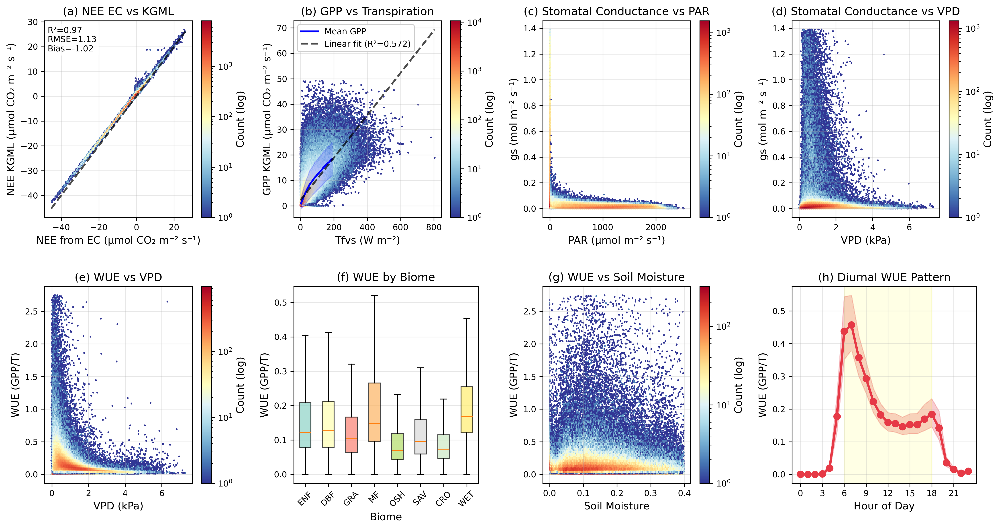


Generating Method Comparisons Figure ...
Saved: fvs_Figure2_MethodComparisons.png/pdf


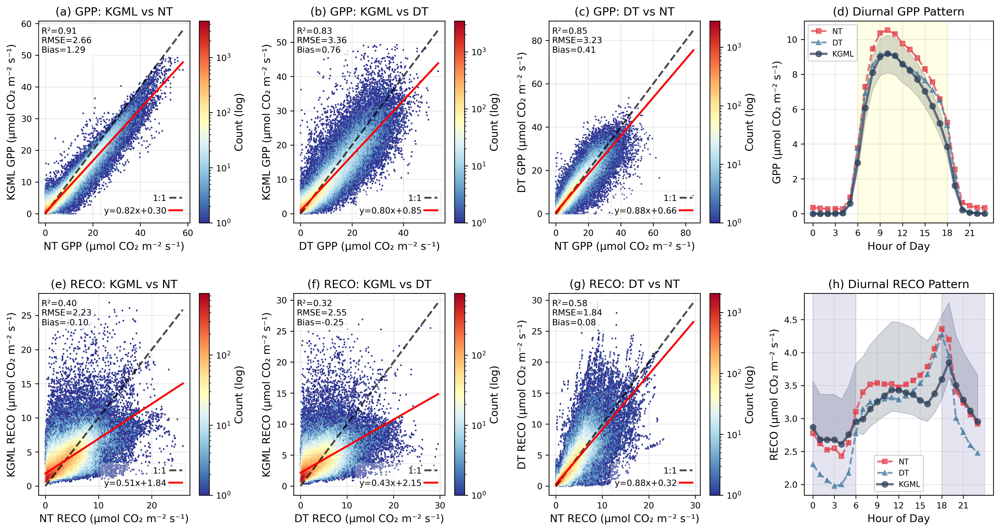


[3/7] Generating Differences & Distribution Figure ...
Saved: fvs_Figure3_DifferencesDistribution.png/pdf


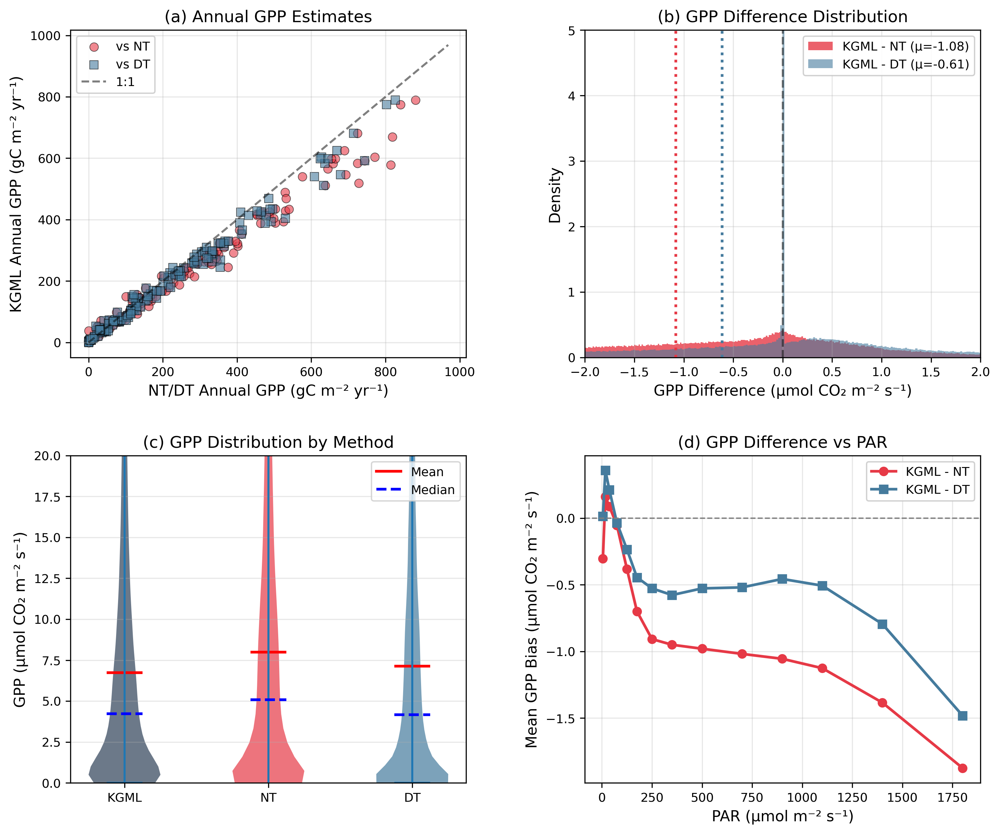


Generating Kok Effect Figure ...
Saved: fvs_Figure4_KokEffect.png/pdf


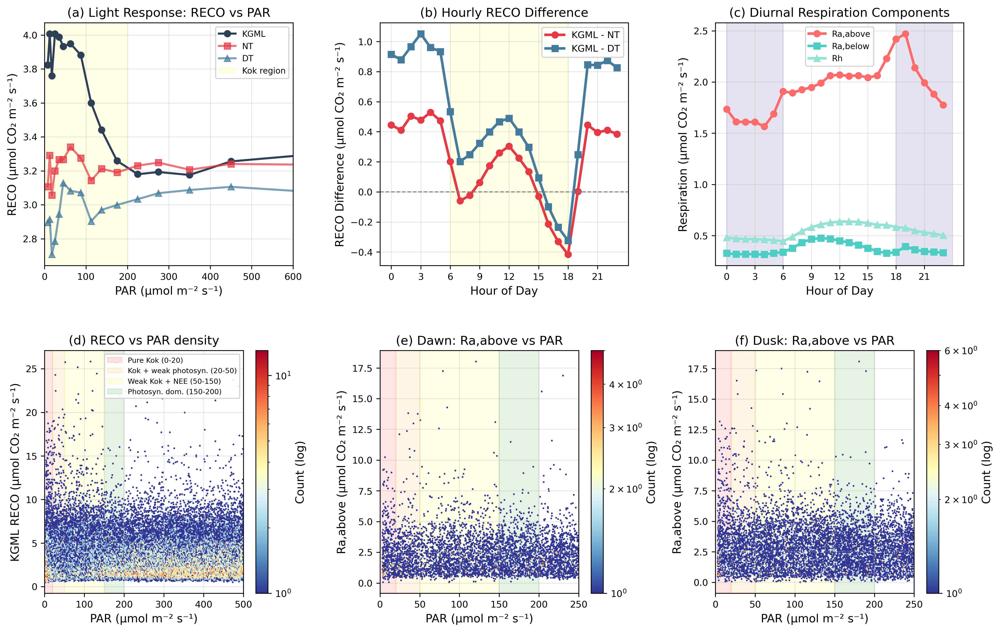


Figure generation complete!


In [31]:
# @title

# ============================================================================
# MAIN EXECUTION AND SUMMARY
# ============================================================================

def generate_all_figures(df_plot, df_out_plot, output_dir='.'):
    """
    Generate all rearranged figures and create summary report
    """
    import os

    print("="*80)
    print("KGML FIGURE REARRANGEMENT - EXECUTION")
    print("="*80)

    results = {}

    # Figure 1
    print("\nGenerating Physical Soundness Figure ...")
    try:
        fig1, missing1 = create_figure1_physical_soundness(df_plot, df_out_plot,
                                                          'fvs_Figure1_PhysicalSoundness')
        results['Figure 1'] = {'status': 'SUCCESS', 'missing': missing1}
    except Exception as e:
        print(f"ERROR in Figure 1: {e}")
        results['Figure 1'] = {'status': 'FAILED', 'error': str(e)}

    # Figure 2
    print("\nGenerating Method Comparisons Figure ...")
    try:
        fig2, missing2 = create_figure2_method_comparisons(df_plot, df_out_plot,
                                                          'fvs_Figure2_MethodComparisons')
        results['Figure 2'] = {'status': 'SUCCESS', 'missing': missing2}
    except Exception as e:
        print(f"ERROR in Figure 2: {e}")
        results['Figure 2'] = {'status': 'FAILED', 'error': str(e)}

    # Figure 3
    print("\n[3/7] Generating Differences & Distribution Figure ...")
    try:
        fig3, missing3 = create_figure3_differences_distribution(df_plot, df_out_plot,
                                                                'fvs_Figure3_DifferencesDistribution')
        results['Figure 3'] = {'status': 'SUCCESS', 'missing': missing3}
    except Exception as e:
        print(f"ERROR in Figure 3: {e}")
        results['Figure 3'] = {'status': 'FAILED', 'error': str(e)}

    # Figure 4
    print("\nGenerating Kok Effect Figure ...")
    try:
        fig4, missing4 = create_figure4_kok_effect(df_plot, df_out_plot,
                                                  'fvs_Figure4_KokEffect')
        results['Figure 4'] = {'status': 'SUCCESS', 'missing': missing4}
    except Exception as e:
        print(f"ERROR in Figure 4: {e}")
        results['Figure 4'] = {'status': 'FAILED', 'error': str(e)}


    print("\n" + "="*80)
    print("Figure generation complete!")
    print("="*80)

    return results


# Example usage comment
if __name__ == "__main__":
    print("""
    ============================================================================
    KGML FIGURES
    ============================================================================
    """)
    out_dir=''
    results = generate_all_figures(df_plot, df_out_plot, output_dir=out_dir)
